In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scirpy as ir
from matplotlib import pyplot as plt, cm as mpl_cm
from cycler import cycler

sc.set_figure_params(figsize=(4, 4))
sc.settings.verbosity = 2  # verbosity: errors (0), warnings (1), info (2), hints (3)

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr

import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

anndata2ri.activate()
%load_ext rpy2.ipython

In [4]:
sc.logging.print_header()

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.0 statsmodels==0.13.5 python-igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.8


In [5]:
adata=sc.read_h5ad('/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/Data/Scanpy_lastCell_TCR.h5ad')

In [6]:
adata.obs.to_csv("/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TCRobs.csv")

In [7]:
adata

AnnData object with n_obs × n_vars = 58301 × 31424
    obs: 'Name', 'doublet_scores', 'predicted_doublets', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Cellname', 'AdjustedID', 'New_Body', 'Week', 'TCRBCRlabel', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Last_cell_type', 'Cell_lineage', 'Last_cell_type2', 'Last_cell_type_num', 'Last_cell_type_num2', 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR

In [90]:
mkdir -p /home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S26

In [8]:
import pandas as pd

def sort_categories(adata, column):
    categories = pd.Series(adata.obs[column].unique(), dtype='str')
    df = categories.str.extract('(\D)(\d+\.\d+)(_.*)')
    df.columns = ['letter', 'number', 'suffix']
    df['number'] = df['number'].astype(float)
    cat_type = pd.CategoricalDtype(categories=['B', 'L', 'T', 'S'], ordered=True)
    df['letter'] = df['letter'].astype(cat_type)
    df.sort_values(by=['letter', 'number'], inplace=True)
    df['sorted_category'] = df.apply(lambda row: row['letter'] + str(row['number']) + row['suffix'], axis=1)
    sorted_categories = df['sorted_category']
    adata.obs[column] = pd.Categorical(adata.obs[column], categories=sorted_categories, ordered=True)
    return adata

In [9]:
adata=sort_categories(adata,"AdjustedID")

In [10]:
adata_PBMC=adata[adata.obs.New_Body.isin(['PBMC'])]

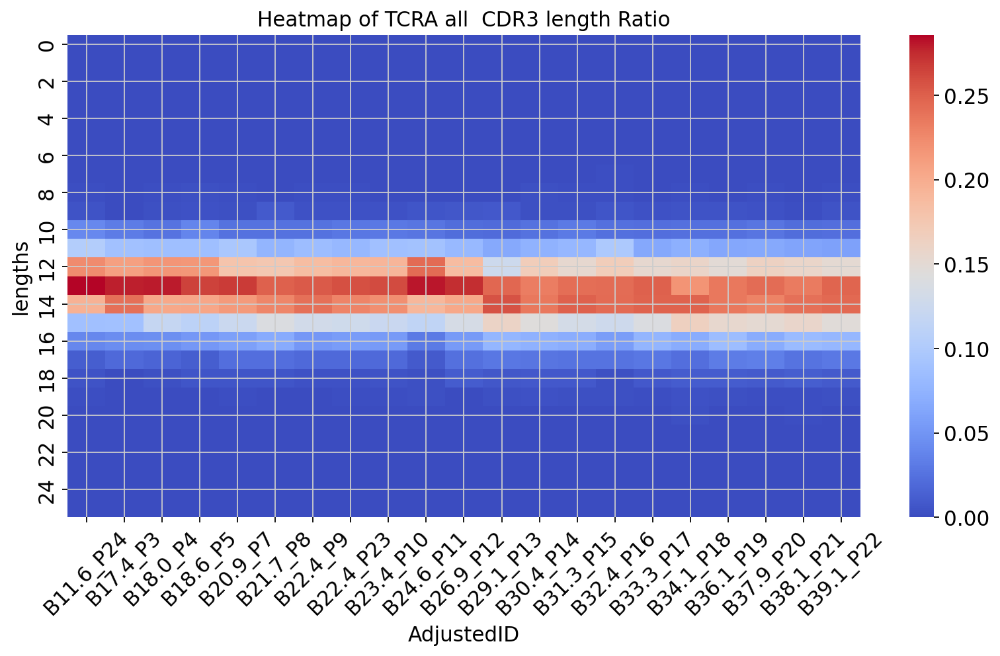

In [11]:
import anndata
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scirpy as ir
def TCR_All_plot_heatmap(adata,col='IR_VDJ_1_junction_aa',title='TRB all',groupSample="AdjustedID"):
    filtered_adata=adata
    df = ir.tl.spectratype(filtered_adata, target_col=groupSample,groupby=col)

    df_sums = df.sum(axis=0)
    df_sums_ratio = df.div(df_sums, axis=1)

    plt.figure(figsize=(12, 6))
    sns.heatmap(df_sums_ratio, xticklabels=True, cmap='coolwarm')
    plt.title(f'Heatmap of {title}  CDR3 length Ratio')
    plt.xticks(rotation=45)  # 旋转x轴标签，使其更易读
    plt.show()
    return df_sums_ratio
TRA_ratio= TCR_All_plot_heatmap(adata_PBMC,col='IR_VJ_1_junction_aa',title='TCRA all')

In [12]:
# 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 
# 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call',
# 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count',
# 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call',
# 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 
# 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus',
# 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive',
# 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 
adata_PBMC.obs[['IR_VDJ_1_v_call','IR_VDJ_1_d_call', 'IR_VDJ_1_j_call',]]
adata_PBMC.obs['IR_VDJmerge']=adata_PBMC.obs['IR_VDJ_1_v_call'].copy().astype('str')+'_'+adata_PBMC.obs[ 'IR_VDJ_1_j_call'].copy().astype('str')

/tmp/ipykernel_21423/1897779447.py:10: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_PBMC.obs['IR_VDJmerge']=adata_PBMC.obs['IR_VDJ_1_v_call'].copy().astype('str')+'_'+adata_PBMC.obs[ 'IR_VDJ_1_j_call'].copy().astype('str')


In [13]:
adata_PBMC.obs['IR_VDJmerge'].value_counts()[1:10]

TRBV20-1_TRBJ2-3    621
TRBV28_TRBJ2-7      598
TRBV5-1_TRBJ2-7     590
TRBV5-1_TRBJ2-3     552
TRBV20-1_TRBJ2-1    517
TRBV5-1_TRBJ2-1     469
TRBV28_TRBJ1-2      464
TRBV9_TRBJ2-3       401
TRBV27_TRBJ2-7      399
Name: IR_VDJmerge, dtype: int64

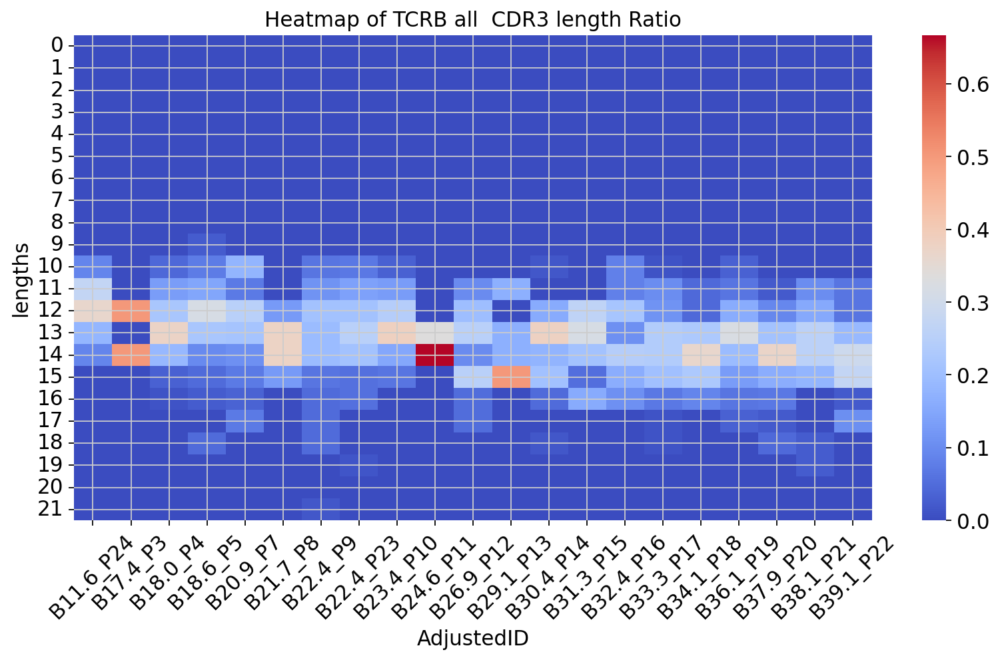

In [14]:
import anndata
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scirpy as ir
def TCR_All_plot_heatmap(adata,col='IR_VDJ_1_junction_aa',title='TRB all',groupSample="AdjustedID"):
    filtered_adata=adata
    df = ir.tl.spectratype(filtered_adata, target_col=groupSample,groupby=col)

    df_sums = df.sum(axis=0)
    df_sums_ratio = df.div(df_sums, axis=1)

    plt.figure(figsize=(12, 6))
    sns.heatmap(df_sums_ratio, xticklabels=True, cmap='coolwarm')
    plt.title(f'Heatmap of {title}  CDR3 length Ratio')
    plt.xticks(rotation=45)  # 旋转x轴标签，使其更易读
    plt.show()
    return df_sums_ratio
testTRBV20_TRBJ2= TCR_All_plot_heatmap(adata_PBMC[adata_PBMC.obs['IR_VDJmerge'].isin(['TRBV20-1_TRBJ2-7'])],col='IR_VDJ_1_junction_aa',title='TCRB all')

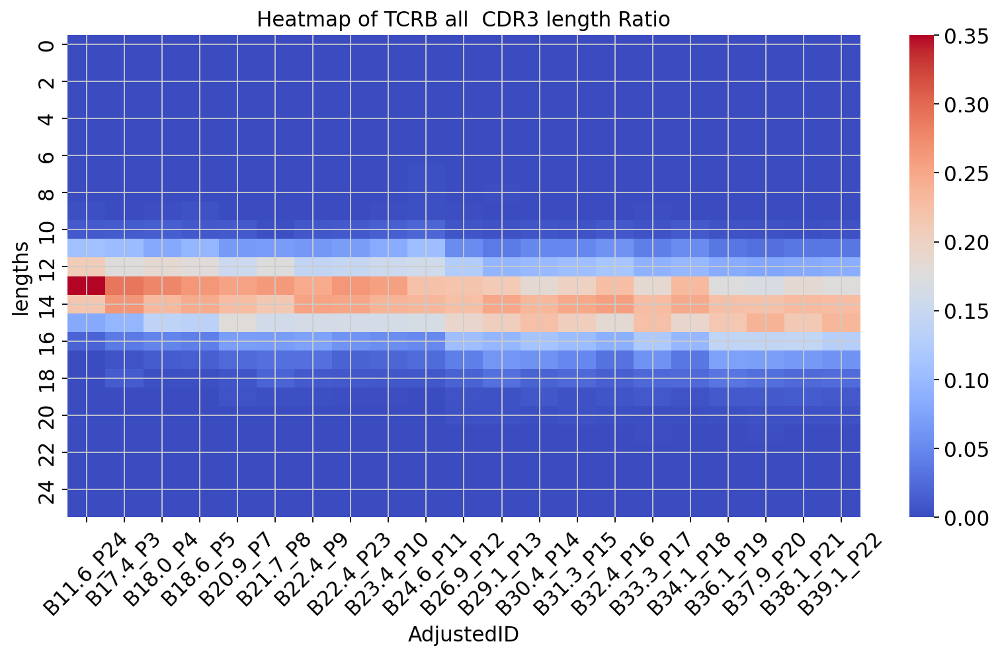

In [15]:
import anndata
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scirpy as ir
def TCR_All_plot_heatmap(adata,col='IR_VDJ_1_junction_aa',title='TRB all',groupSample="AdjustedID"):
    filtered_adata=adata
    df = ir.tl.spectratype(filtered_adata, target_col=groupSample,groupby=col)

    df_sums = df.sum(axis=0)
    df_sums_ratio = df.div(df_sums, axis=1)

    plt.figure(figsize=(12, 6))
    sns.heatmap(df_sums_ratio, xticklabels=True, cmap='coolwarm')
    plt.title(f'Heatmap of {title}  CDR3 length Ratio')
    plt.xticks(rotation=45)  # 旋转x轴标签，使其更易读
    plt.show()
    return df_sums_ratio
TRB_ratio= TCR_All_plot_heatmap(adata_PBMC,col='IR_VDJ_1_junction_aa',title='TCRB all')



`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


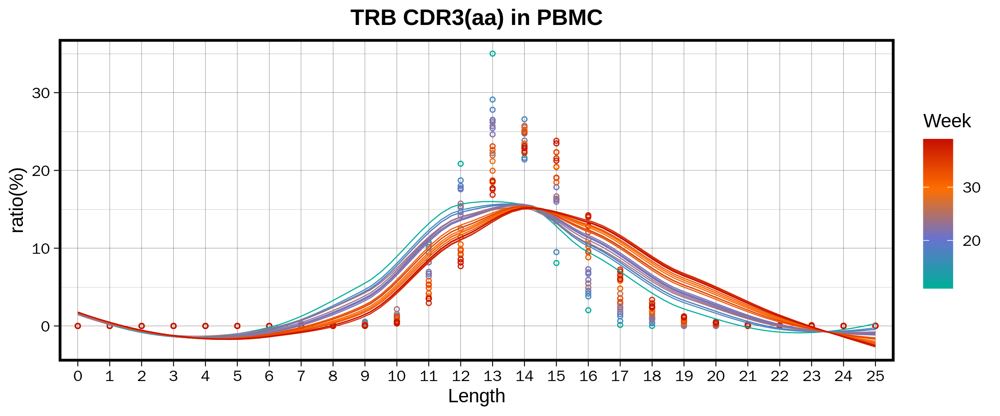

In [114]:
%%R -w 2400 -h 1000 -r 300 -i TRB_ratio
library(tidyverse)
library(reshape2)
library(ggplot2)
library(dplyr)
library(RColorBrewer )
plot_PBMC_sum_ratio <- function(PBMC_sums_ratio, plot_title = 'BCR IGH CDR3(aa) in PBMC') {
  PBMC_sum_ratio <- rownames_to_column(PBMC_sums_ratio)
  PBMC_sum_ratio <- melt(PBMC_sum_ratio, id = c("rowname"))
  PBMC_sum_ratio$rowname <- factor(PBMC_sum_ratio$rowname, level = unique(PBMC_sum_ratio$rowname))

  colnames(PBMC_sum_ratio) <- c('Length', 'Sample', 'ratio')
  PBMC_sum_ratio$ratio <- PBMC_sum_ratio$ratio * 100
  
 PBMC_sum_ratio$Week <- as.numeric(substring(PBMC_sum_ratio$Sample,2,4))

p <- ggplot(PBMC_sum_ratio, aes(Length, ratio, color = Week, group=Sample)) +
  geom_point(shape=1,size=1) +
#   geom_line() +
  geom_smooth(se=F,size=0.3) +
  ggtitle(plot_title) +
  theme_linedraw() +
  xlab('Length') +
  ylab('ratio(%)') +
  theme(plot.title = element_text(hjust = 0.5, size = 13, face = "bold"),
       panel.border = element_rect(linetype = "solid", colour = "black", size = 1.5))

print(p)

  return(p)
}
TRB_plot <- plot_PBMC_sum_ratio(TRB_ratio, plot_title = 'TRB CDR3(aa) in PBMC')+
scale_color_gradientn(colours = rev(colorRampPalette(c("#C71000B2","#FF6F00B2","#6a73cf","#00AF99" ))(100)))
print(TRB_plot)
ggsave(plot = TRB_plot, filename ='/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/FigureI_TRB_CDR3time.pdf', width = 8, height = 4)

`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


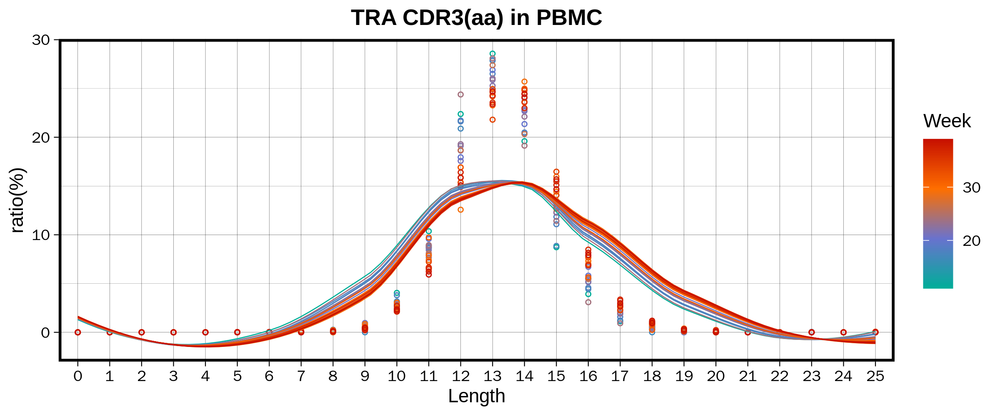

In [115]:
%%R -w 2400 -h 1000 -r 300 -i TRA_ratio
library(tidyverse)
library(reshape2)
library(ggplot2)
library(dplyr)
library(RColorBrewer )
plot_PBMC_sum_ratio <- function(PBMC_sums_ratio, plot_title = 'BCR IGH CDR3(aa) in PBMC') {
  PBMC_sum_ratio <- rownames_to_column(PBMC_sums_ratio)
  PBMC_sum_ratio <- melt(PBMC_sum_ratio, id = c("rowname"))
  PBMC_sum_ratio$rowname <- factor(PBMC_sum_ratio$rowname, level = unique(PBMC_sum_ratio$rowname))

  colnames(PBMC_sum_ratio) <- c('Length', 'Sample', 'ratio')
  PBMC_sum_ratio$ratio <- PBMC_sum_ratio$ratio * 100
  
 PBMC_sum_ratio$Week <- as.numeric(substring(PBMC_sum_ratio$Sample,2,4))

p <- ggplot(PBMC_sum_ratio, aes(Length, ratio, color = Week, group=Sample)) +
  geom_point(shape=1,size=1) +
#   geom_line() +
  geom_smooth(se=F,size=0.3) +
  ggtitle(plot_title) +
  theme_linedraw() +
  xlab('Length') +
  ylab('ratio(%)') +
  theme(plot.title = element_text(hjust = 0.5, size = 13, face = "bold"),
       panel.border = element_rect(linetype = "solid", colour = "black", size = 1.5))

print(p)

  return(p)
}
TRA_plot <- plot_PBMC_sum_ratio(TRA_ratio, plot_title = 'TRA CDR3(aa) in PBMC')+
scale_color_gradientn(colours = rev(colorRampPalette(c("#C71000B2","#FF6F00B2","#6a73cf","#00AF99" ))(100)))
print(TRA_plot)
ggsave(plot = TRA_plot, filename ='/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/FigureI_TRA_CDR3time.pdf', width = 8, height = 4)

In [ ]:
%%R -w 2400 -h 1000 -r 300 -i TRB_ratio
library(tidyverse)
library(reshape2)
library(ggplot2)
library(dplyr)
library(RColorBrewer )
plot_PBMC_sum_ratio <- function(PBMC_sums_ratio, plot_title = 'BCR IGH CDR3(aa) in PBMC') {
  PBMC_sum_ratio <- rownames_to_column(PBMC_sums_ratio)
  PBMC_sum_ratio <- melt(PBMC_sum_ratio, id = c("rowname"))
  PBMC_sum_ratio$rowname <- factor(PBMC_sum_ratio$rowname, level = unique(PBMC_sum_ratio$rowname))

  colnames(PBMC_sum_ratio) <- c('Length', 'Sample', 'ratio')
  PBMC_sum_ratio$ratio <- PBMC_sum_ratio$ratio * 100
  
 PBMC_sum_ratio$Week <- as.numeric(substring(PBMC_sum_ratio$Sample,2,4))

p <- ggplot(PBMC_sum_ratio, aes(Length, ratio, color = Week, group=Sample)) +
  geom_point(shape=1,size=1) +
#   geom_line() +
  geom_smooth(se=F, method='gam',size=0.3) +
  ggtitle(plot_title) +
  theme_linedraw() +
  xlab('Length') +
  ylab('ratio(%)') +
  theme(plot.title = element_text(hjust = 0.5, size = 13, face = "bold"), 
        panel.border = element_rect(linetype = "solid", colour = "black", size = 1.5))

print(p)

  return(p)
}
TRB_plot <- plot_PBMC_sum_ratio(TRB_ratio, plot_title = 'TRB CDR3(aa) in PBMC')+
scale_color_gradientn(colours = rev(colorRampPalette(c("#C71000B2","#FF6F00B2","#6a73cf","#00AF99" ))(100)))
# scale_color_gradientn(colours = rev(colorRampPalette(brewer.pal(9, "Spectral"))(100)))
print(TRB_plot )
ggsave(plot=TRB_plot ,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/FigureF.pdf",width=8,height=4)

In [ ]:
%%R -w 2400 -h 1000 -r 300 -i  TRA_ratio
TRA_plot <- plot_PBMC_sum_ratio(TRA_ratio, plot_title = 'TRA CDR3(aa) in PBMC')+
scale_color_gradientn(colours = rev(colorRampPalette(c("#C71000B2","#FF6F00B2","#6a73cf","#00AF99" ))(100)))+theme(panel.border = element_rect(linetype = "solid", colour = "black", size = 1.5))
# scale_color_gradientn(colours = rev(colorRampPalette(brewer.pal(9, "Spectral"))(100)))
print(TRA_plot)
ggsave(plot=TRA_plot ,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/FigureG.pdf",width=8,height=4)

In [18]:
adata_PBMC.obs['IR_VDJmerge'].value_counts()[1:10].index.astype('str').tolist()

['TRBV20-1_TRBJ2-3',
 'TRBV28_TRBJ2-7',
 'TRBV5-1_TRBJ2-7',
 'TRBV5-1_TRBJ2-3',
 'TRBV20-1_TRBJ2-1',
 'TRBV5-1_TRBJ2-1',
 'TRBV28_TRBJ1-2',
 'TRBV9_TRBJ2-3',
 'TRBV27_TRBJ2-7']

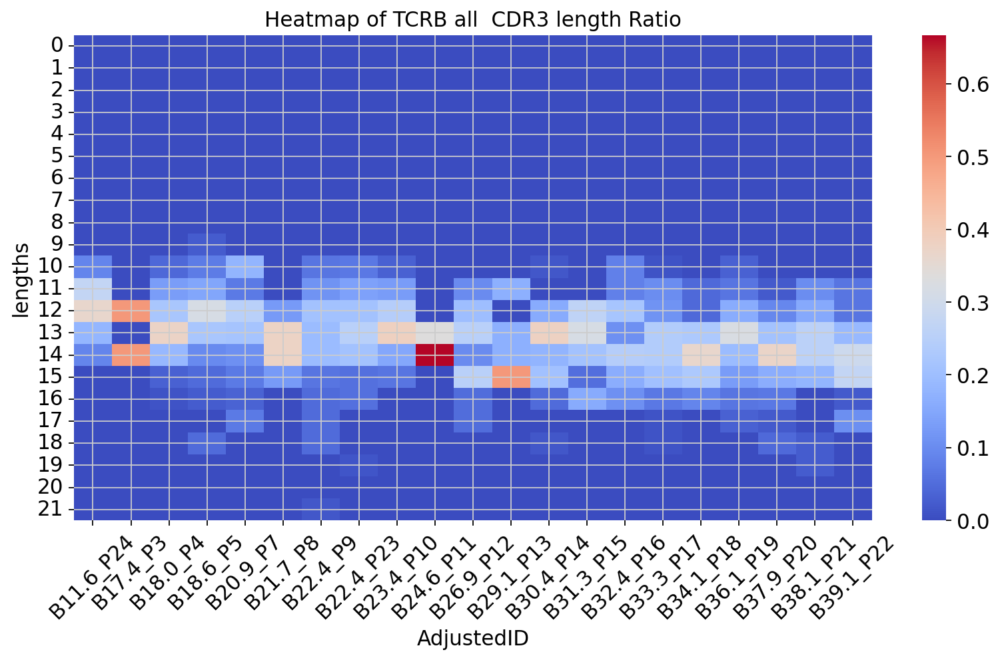

In [19]:
testTRBV20_TRBJ2= TCR_All_plot_heatmap(adata_PBMC[adata_PBMC.obs['IR_VDJmerge'].isin(['TRBV20-1_TRBJ2-7'])],col='IR_VDJ_1_junction_aa',title='TCRB all')

`geom_smooth()` using formula = 'y ~ s(x, bs = "cs")'
`geom_smooth()` using formula = 'y ~ s(x, bs = "cs")'


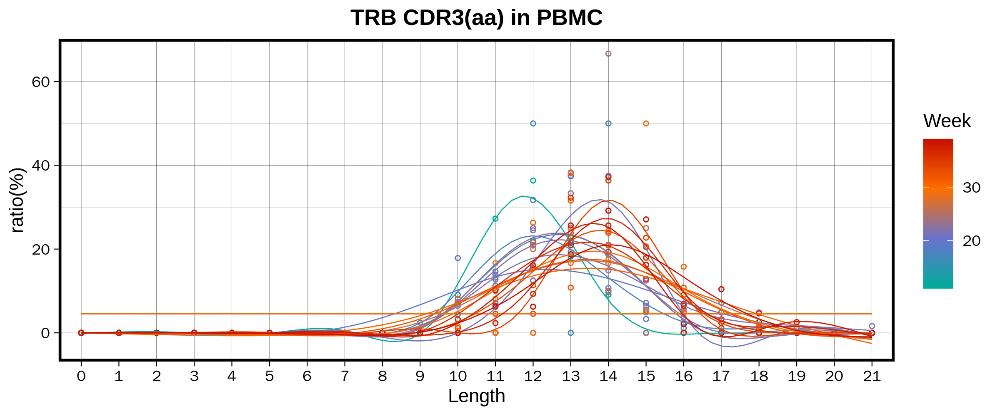

In [20]:
%%R -w 2400 -h 1000 -r 300 -i testTRBV20_TRBJ2
my_plot <- plot_PBMC_sum_ratio(testTRBV20_TRBJ2, plot_title = 'TRB CDR3(aa) in PBMC')+
scale_color_gradientn(colours = rev(colorRampPalette(c("#C71000B2","#FF6F00B2","#6a73cf","#00AF99" ))(100)))+theme(panel.border = element_rect(linetype = "solid", colour = "black", size = 1.5))
# scale_color_gradientn(colours = rev(colorRampPalette(brewer.pal(9, "Spectral"))(100)))
print(my_plot)

In [21]:
# !mkdir -p /data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRA2
!mkdir -p /data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/IR_VDJmerge

In [22]:
ls /data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/IR_VDJmerge/ 

TRBV20-1_TRBJ2-1_ratio.csv  TRBV5-1_TRBJ2-1_ratio.csv
TRBV20-1_TRBJ2-3_ratio.csv  TRBV5-1_TRBJ2-3_ratio.csv
TRBV27_TRBJ2-7_ratio.csv    TRBV5-1_TRBJ2-7_ratio.csv
TRBV28_TRBJ1-2_ratio.csv    TRBV9_TRBJ2-3_ratio.csv
TRBV28_TRBJ2-7_ratio.csv


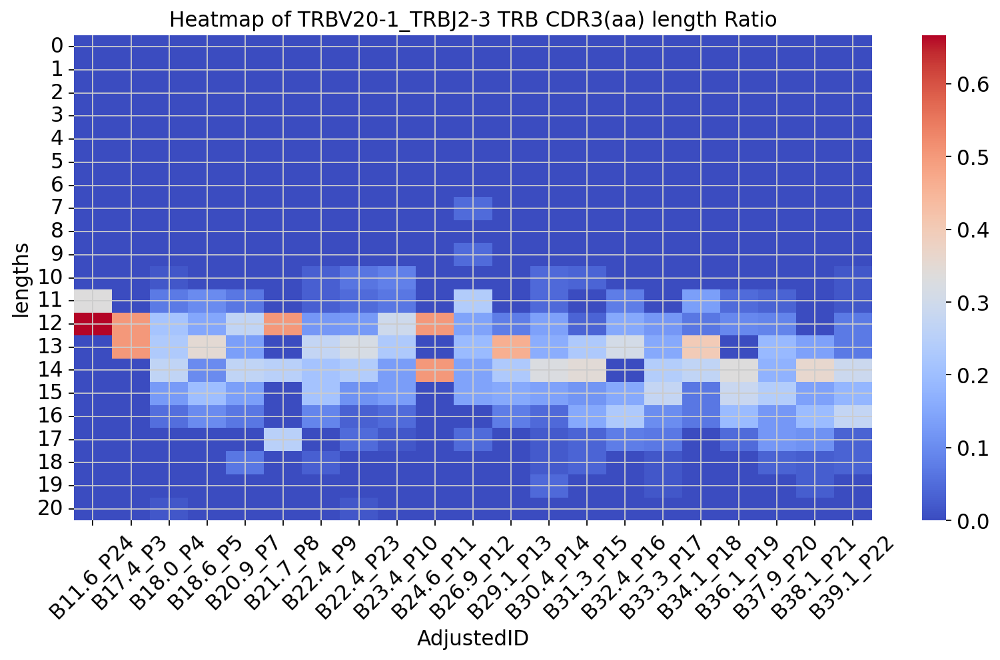

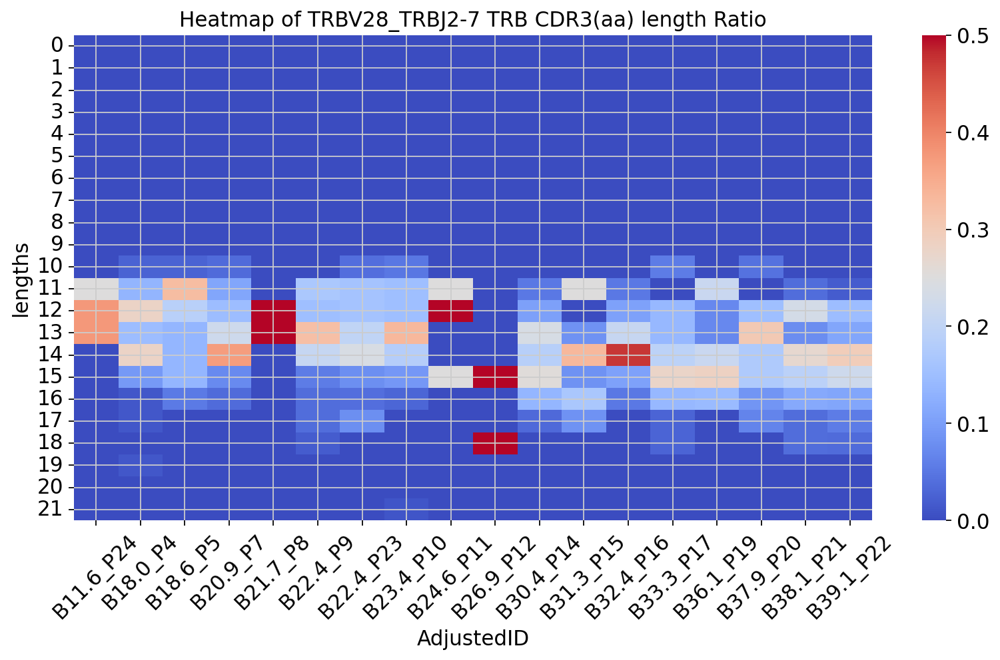

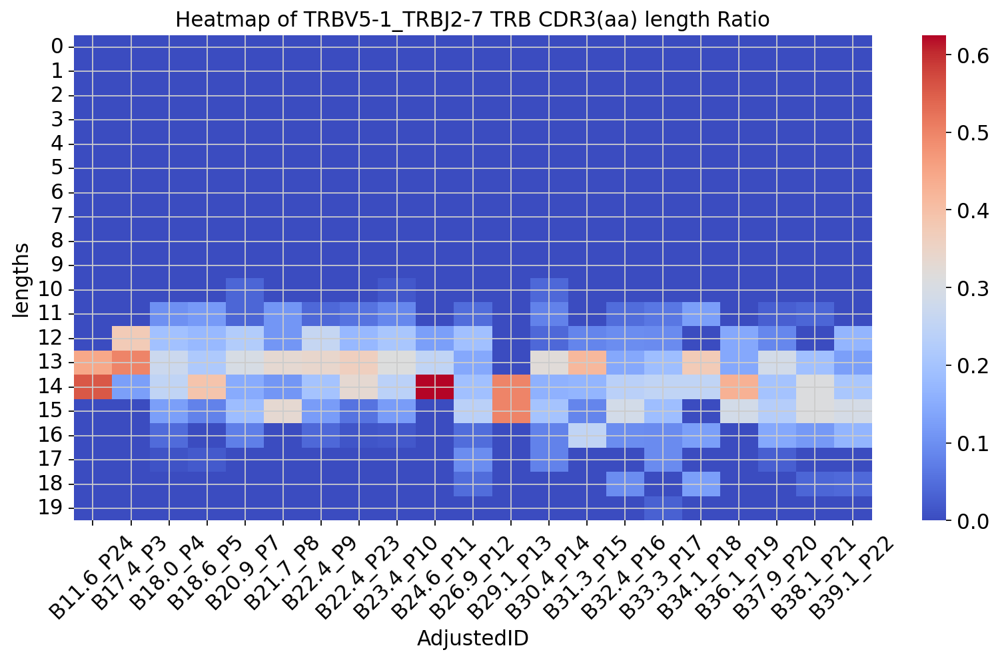

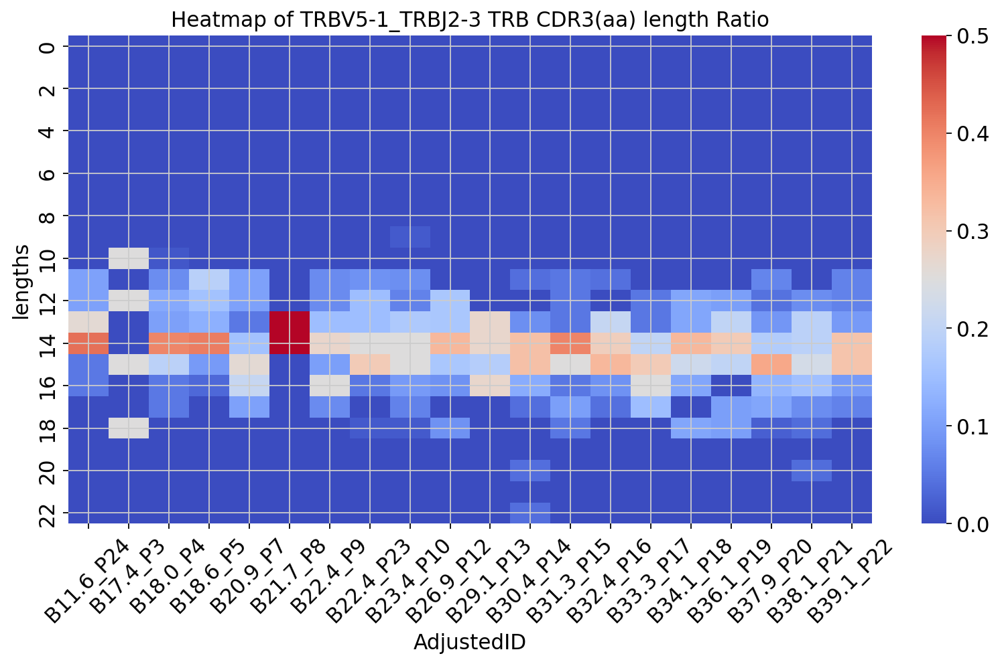

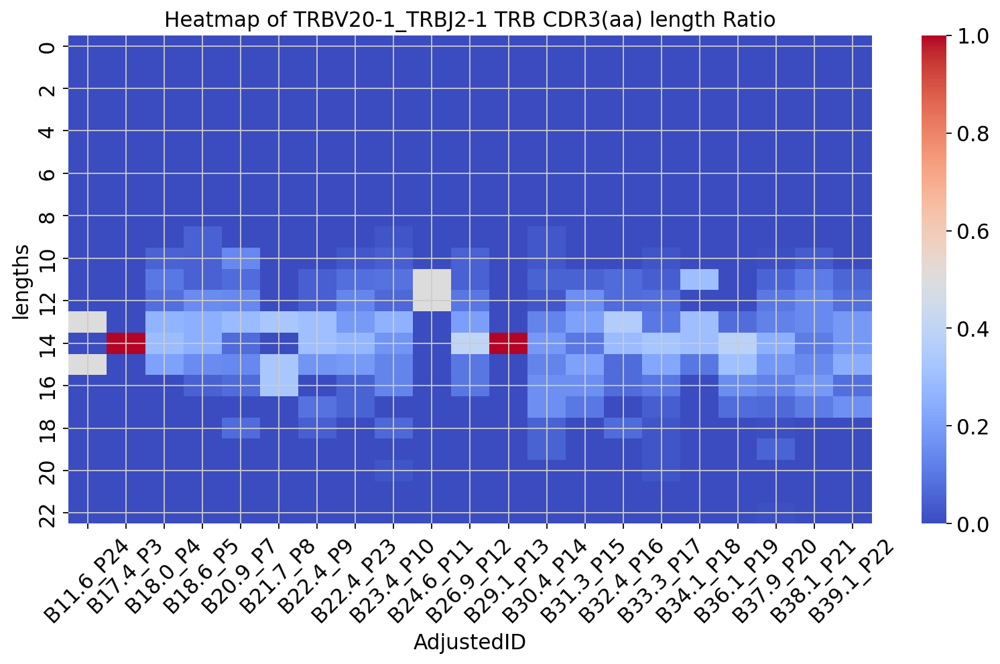

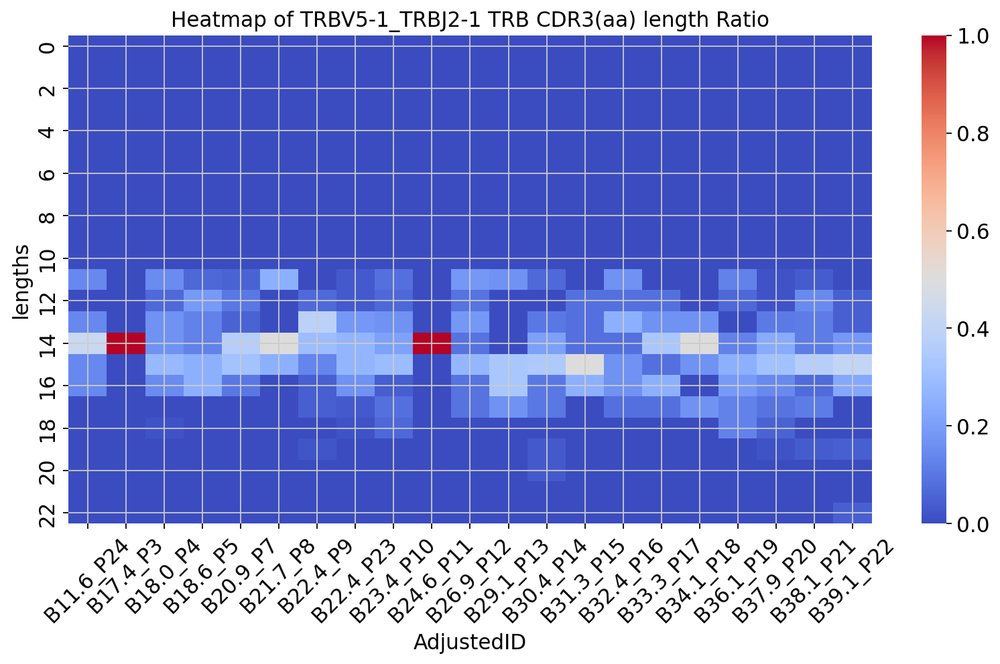

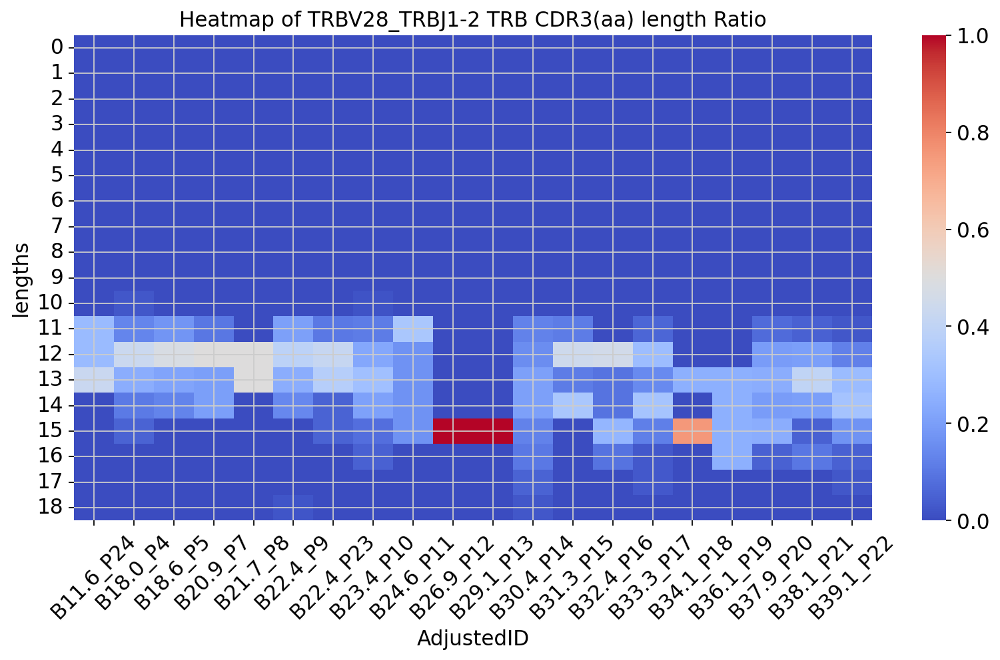

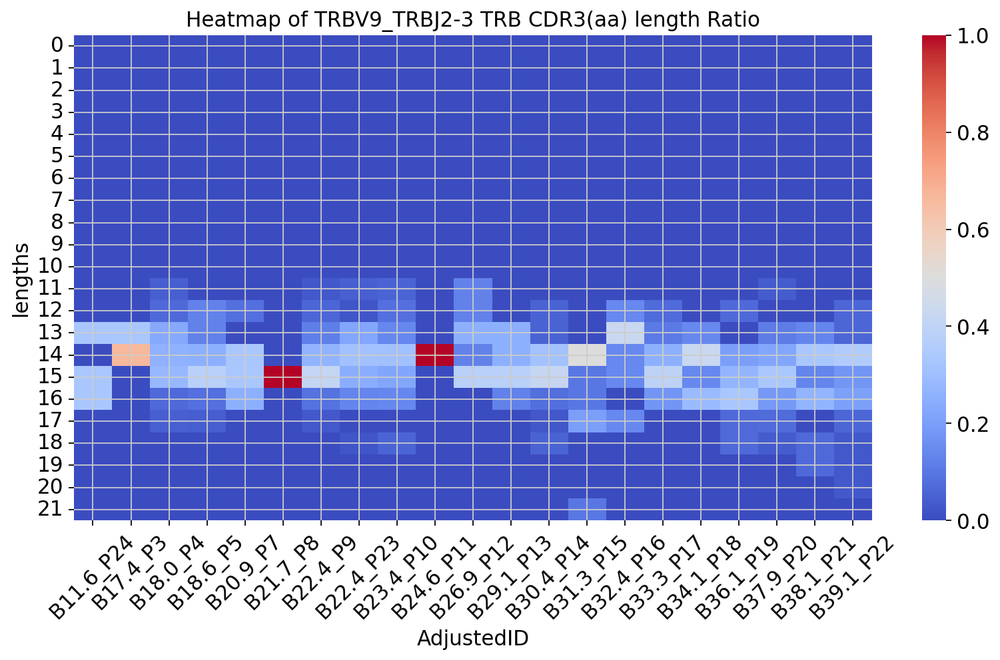

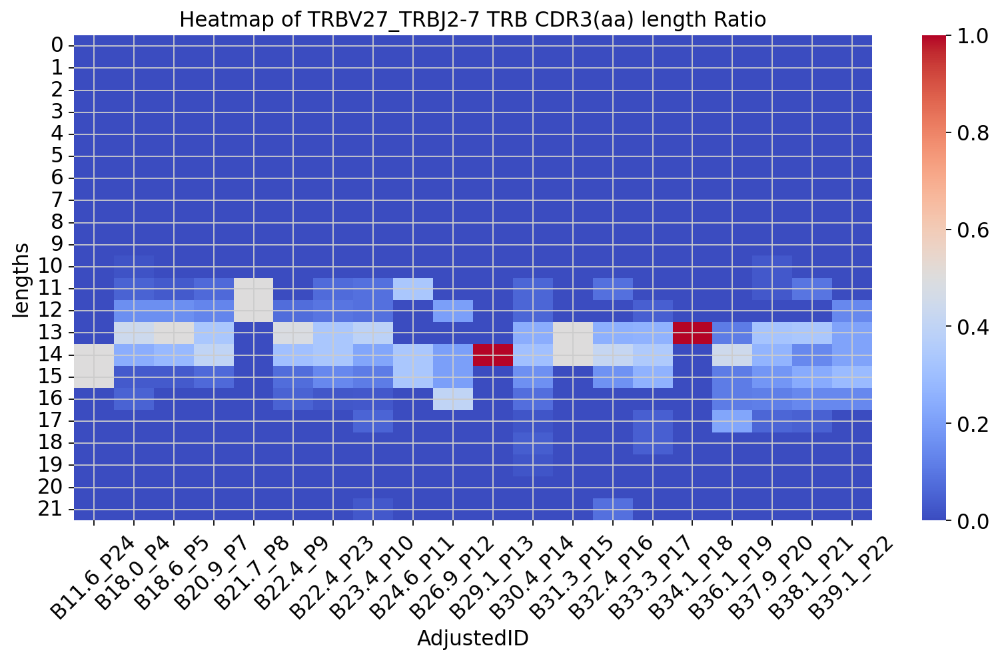

In [23]:
import anndata
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scirpy as ir
import os


def TCR_plot_heatmap_cell_type(adata, cell_type,groupcell='IR_VDJmerge',col='IR_VDJ_1_junction_aa',title='BCR all',groupSample="AdjustedID"):
    filtered_adata = adata[adata.obs[groupcell] == cell_type]
    df = ir.tl.spectratype(filtered_adata, target_col=groupSample,groupby=col)

    df_sums = df.sum(axis=0)
    df_sums_ratio = df.div(df_sums, axis=1)

    plt.figure(figsize=(12, 6))
    sns.heatmap(df_sums_ratio, xticklabels=True, cmap='coolwarm')
    plt.title(f'Heatmap of {cell_type} {title} CDR3(aa) length Ratio')
    plt.xticks(rotation=45)  
    plt.show()
    return df_sums_ratio

unique_cell_types = adata_PBMC.obs['Last_cell_type'].unique()


PAths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/IR_VDJmerge/'
os.system('rm -rf '+PAths+'/*.csv')
for cell_type in adata_PBMC.obs['IR_VDJmerge'].value_counts()[1:10].index.astype('str').tolist():
    cellratio=TCR_plot_heatmap_cell_type(adata_PBMC, cell_type,col='IR_VDJ_1_junction_aa',title='TRB')

    cellratio.to_csv(PAths+cell_type+'_ratio.csv')

In [91]:
# %%R -w 2500 -h 2000 -r 300 
# TRVplot_list <- list()
# paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/IR_VDJmerge/'
# # Adatalist=c("PBMC_abT(entry)_ratio.csv", "PBMC_Cycling Treg_ratio.csv", "PBMC_GNG4 +CD8aa+T_ratio.csv", "PBMC_Naïve CD4 T_ratio.csv", 
# # "PBMC_Naïve CD8 T_ratio.csv", "PBMC_NK T_ratio.csv", "PBMC_Tem_ratio.csv", "PBMC_Th17like_INNATE_T_ratio.csv", "PBMC_Treg_ratio.csv")

# # Adatalist=c( "PBMC_Naïve CD4 T_ratio.csv", 
# # "PBMC_Naïve CD8 T_ratio.csv", "PBMC_NK T_ratio.csv", "PBMC_Tem_ratio.csv", "PBMC_Th17like_INNATE_T_ratio.csv", "PBMC_Treg_ratio.csv")

# for (i in dir(paths)){
#   print(i)
#   name=gsub('_ratio.csv','',i)
#   TCRdata=read.csv(paste0(paths,i))
#   TCRdata<-TCRdata[rowSums(TCRdata)>0,]
  
#   # 将每个绘制的图像存储在plot_list中
#   TRVplot_list[[i]] <- plot_PBMC_sum_ratio_celltype(TCRdata, plot_title =paste0(name,' TRB CDR3(aa) '))
# }


In [ ]:
# %%R -w 1500 -h 12000 -r 300 
# grid.arrange(grobs = TRVplot_list, ncol = 1)  

In [25]:
!mkdir -p /data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRA2
!mkdir -p /data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRB2

In [26]:
mkdir -p /data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRA2/PBMC_ILC2

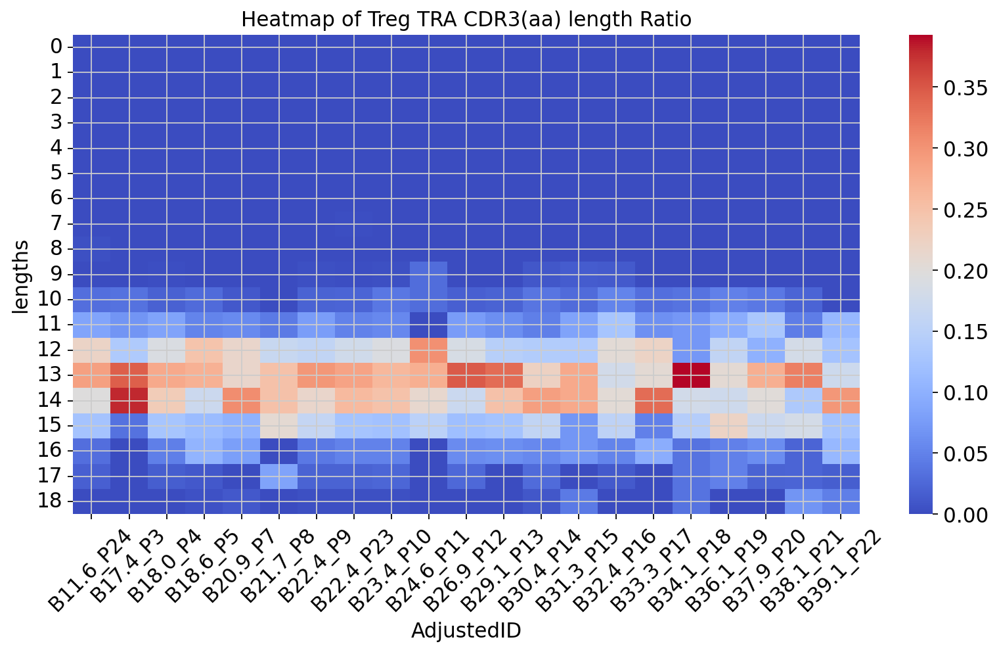

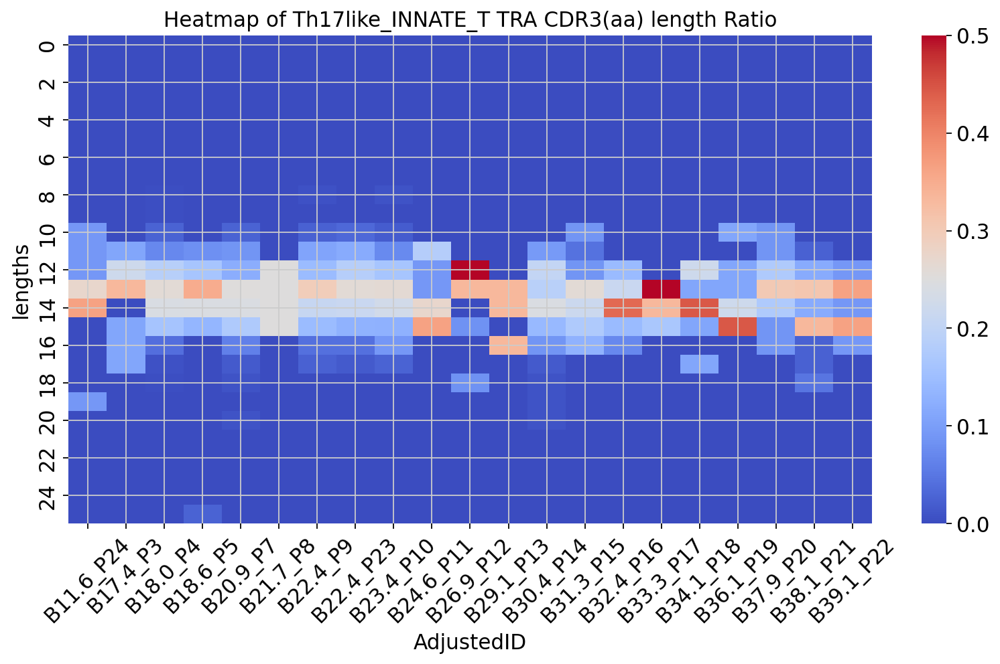

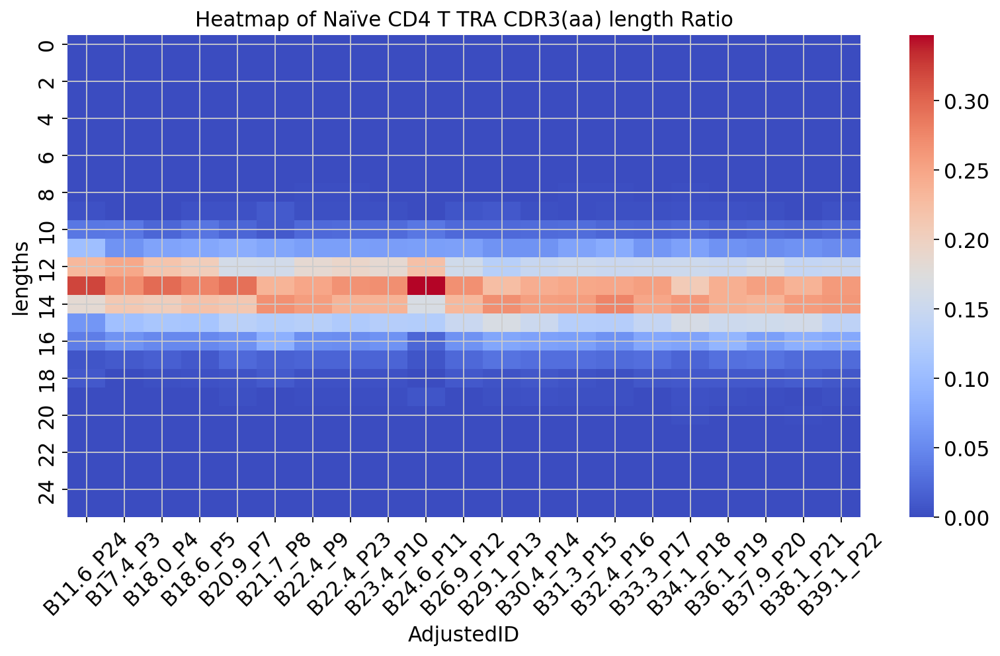

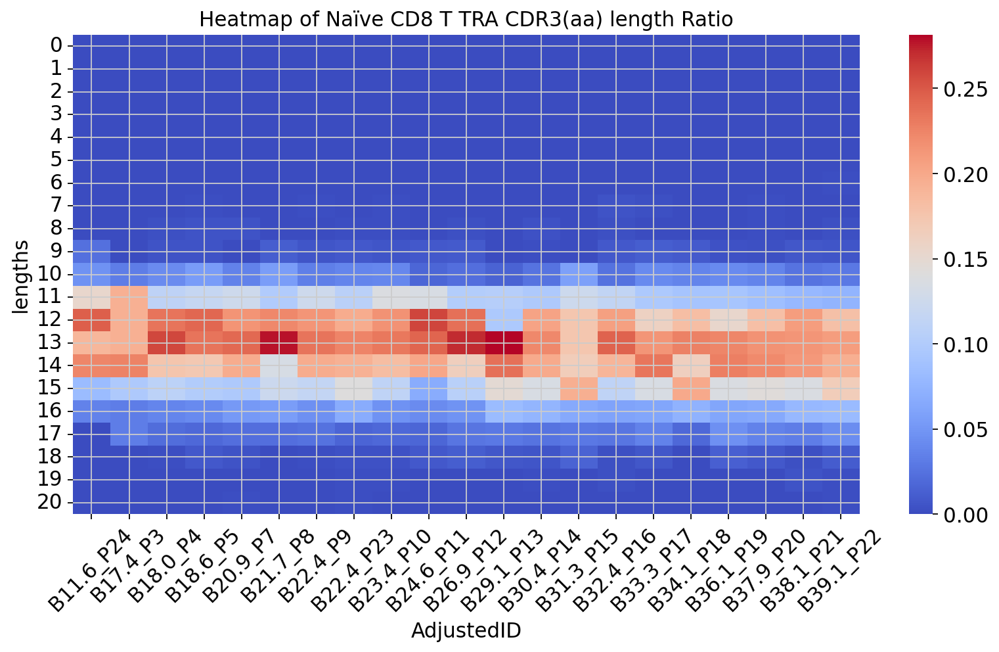

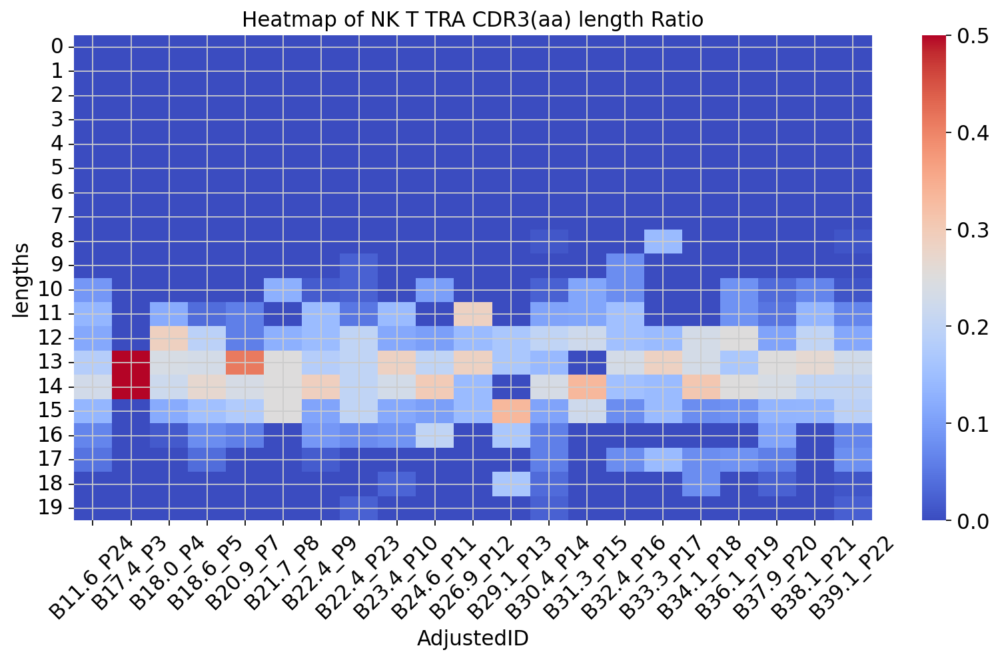

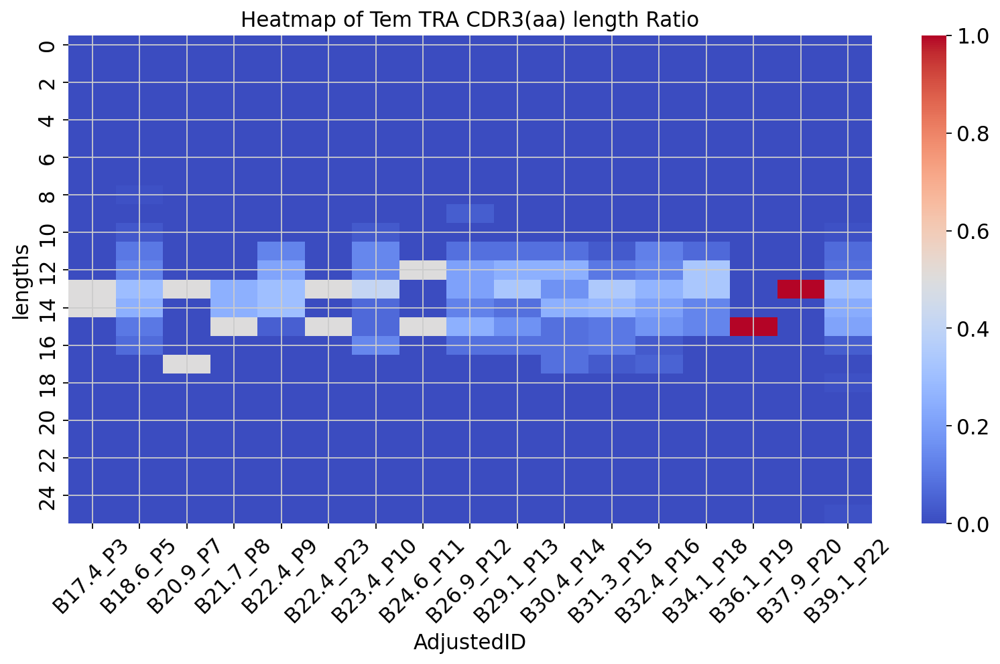

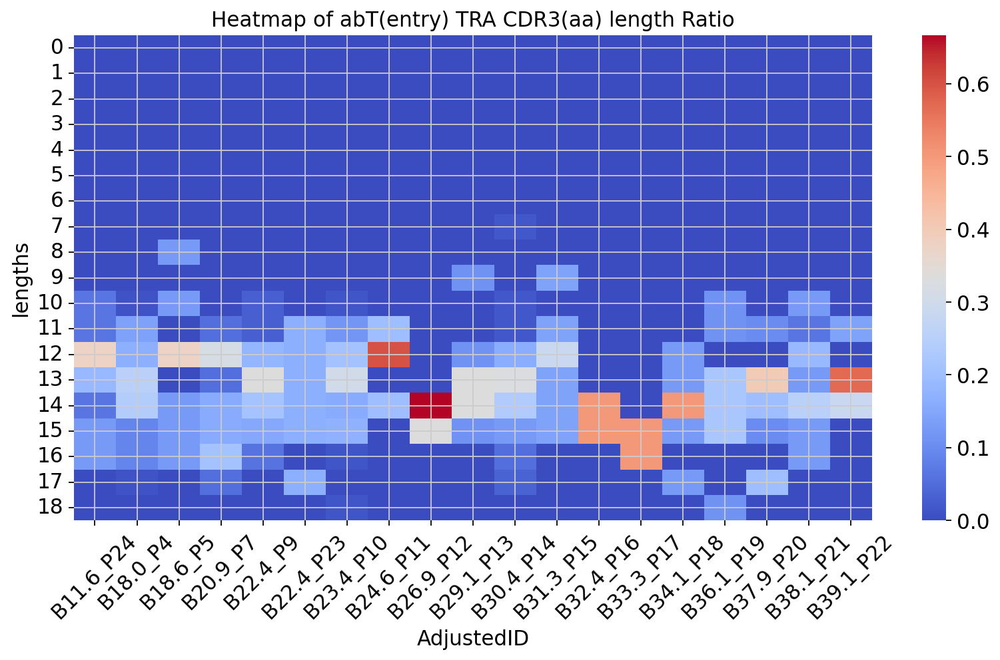

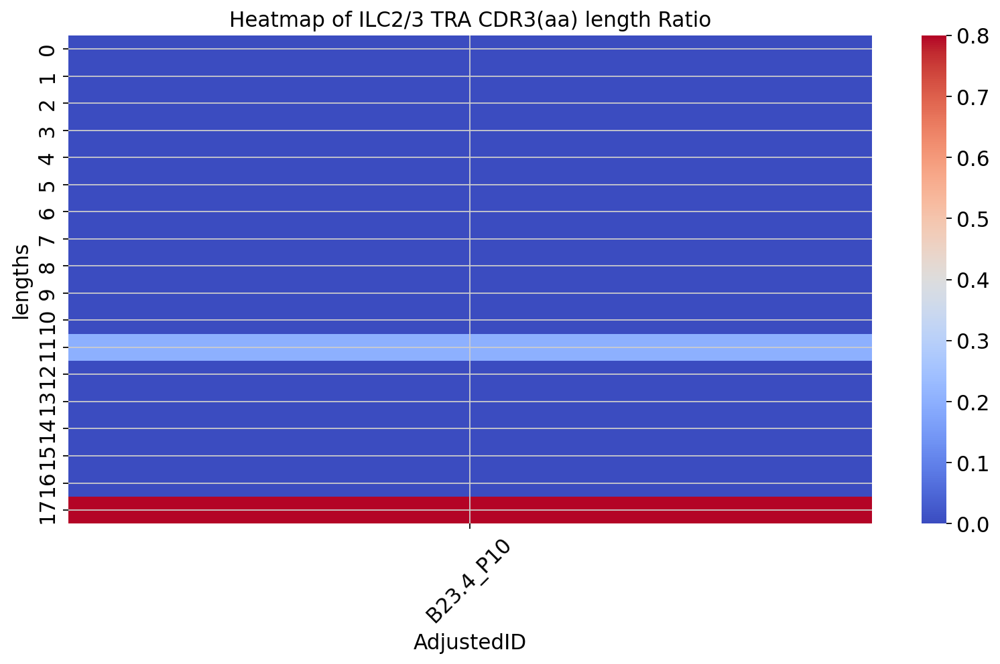

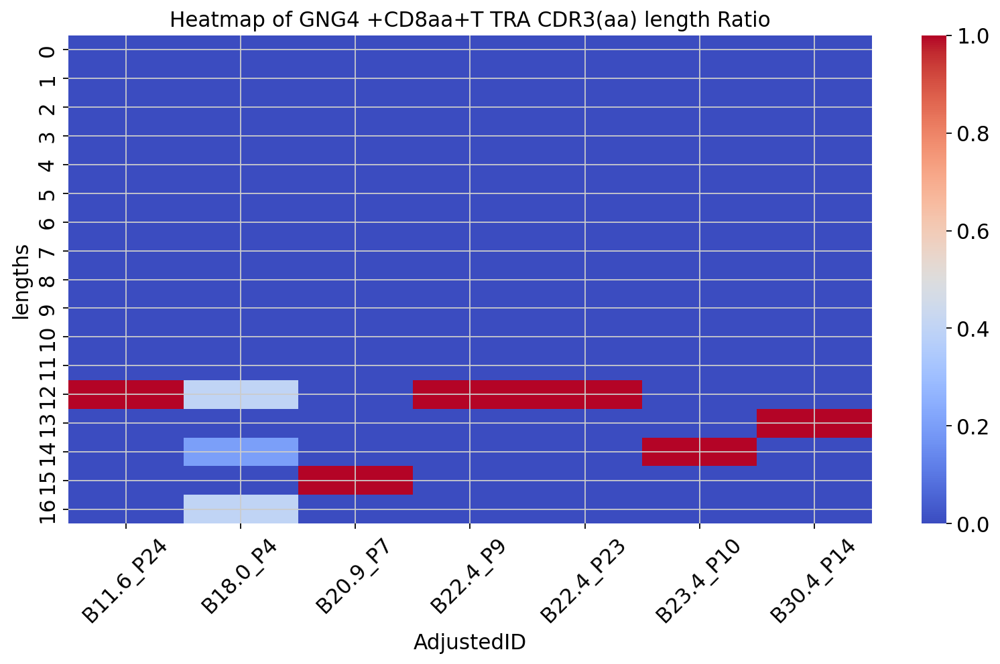

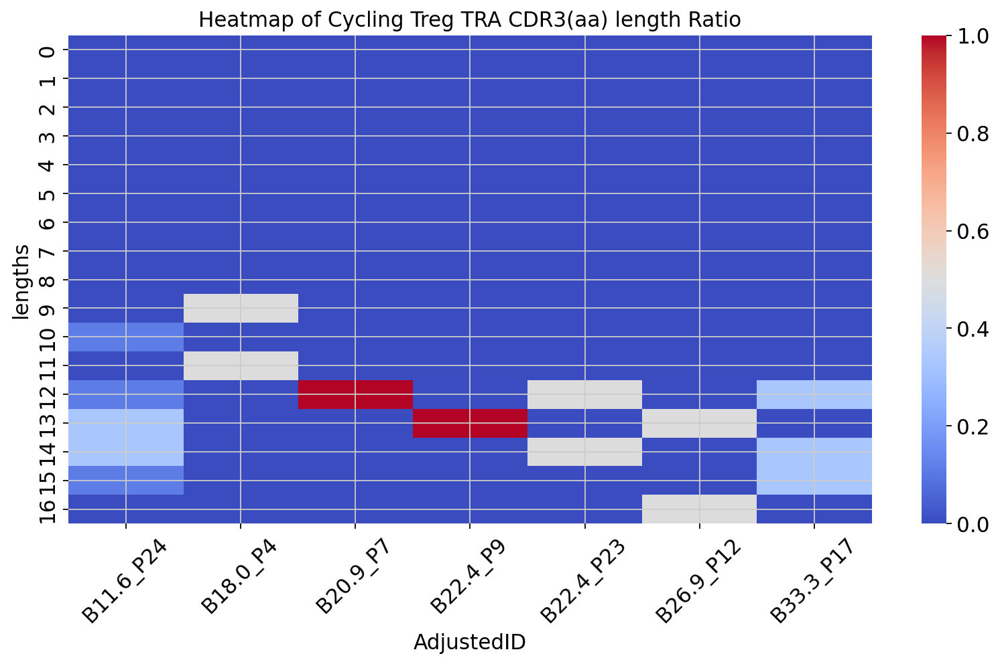

In [27]:
import anndata
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scirpy as ir
import os


def TCR_plot_heatmap_cell_type(adata, cell_type,groupcell='Last_cell_type',col='IR_VDJ_1_junction_aa',title='BCR all',groupSample="AdjustedID"):
    filtered_adata = adata[adata.obs[groupcell] == cell_type]
    df = ir.tl.spectratype(filtered_adata, target_col=groupSample,groupby=col)

    df_sums = df.sum(axis=0)
    df_sums_ratio = df.div(df_sums, axis=1)

    plt.figure(figsize=(12, 6))
    sns.heatmap(df_sums_ratio, xticklabels=True, cmap='coolwarm')
    plt.title(f'Heatmap of {cell_type} {title} CDR3(aa) length Ratio')
    plt.xticks(rotation=45)  
    plt.show()
    return df_sums_ratio

unique_cell_types = adata_PBMC.obs['Last_cell_type'].unique()


PAths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRA2/PBMC_'
os.system('rm -rf '+PAths+'/*.csv')
for cell_type in unique_cell_types:
    cellratio=TCR_plot_heatmap_cell_type(adata_PBMC, cell_type,col='IR_VJ_1_junction_aa',title='TRA')

    cellratio.to_csv(PAths+cell_type+'_ratio.csv')

In [28]:

# rm -rf /data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRA2/*

In [30]:
%%R
dir('/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRA2/')

 [1] "PBMC_abT(entry)_ratio.csv"        "PBMC_Cycling Treg_ratio.csv"     
 [3] "PBMC_GNG4 +CD8aa+T_ratio.csv"     "PBMC_ILC2"                       
 [5] "PBMC_Naïve CD4 T_ratio.csv"       "PBMC_Naïve CD8 T_ratio.csv"      
 [7] "PBMC_NK T_ratio.csv"              "PBMC_Tem_ratio.csv"              
 [9] "PBMC_Th17like_INNATE_T_ratio.csv" "PBMC_Treg_ratio.csv"             


In [31]:
%%R -w 2500 -h 2000 -r 300 
dir('/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRA2/')
library(tidyverse)
library(reshape2)
library(gridExtra)
plot_PBMC_sum_ratio_celltype <- function(PBMC_data, plot_title = 'BCR IGH CDR3(aa) in PBMC') {

  PBMC_sum_ratio <- melt(PBMC_data, id = c("lengths"))
  PBMC_sum_ratio$lengths <- factor(PBMC_sum_ratio$lengths, level = unique(PBMC_sum_ratio$lengths))

  colnames(PBMC_sum_ratio) <- c('Length', 'Sample', 'ratio')
  PBMC_sum_ratio$ratio <- PBMC_sum_ratio$ratio * 100
   PBMC_sum_ratio$Week <- as.numeric(substring(PBMC_sum_ratio$Sample,2,4))
    p <- ggplot(PBMC_sum_ratio, aes(Length, ratio, color = Week, group=Sample)) +
  geom_point(shape=1,size=1) +
#   geom_line() +
#   geom_smooth(se=F, method='gam') +
     geom_smooth(se=F,size=0.3) +
  ggtitle(plot_title) +
  theme_linedraw() +
  xlab('Length') +
  ylab('ratio(%)') +
  theme(plot.title = element_text(hjust = 0.5, size = 13, face = "bold"),
        panel.border = element_rect(linetype = "solid", colour = "black", size = 1.5))+
    scale_color_gradientn(colours = rev(colorRampPalette(c("#C71000B2","#FF6F00B2","#6a73cf","#00AF99" ))(100)))
#     scale_color_gradientn(colours = rev(colorRampPalette(brewer.pal(9, "Spectral"))(100)))
  
  return(p)
}

TRAplot_list <- list()
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRA2/'
# Adatalist=c("PBMC_abT(entry)_ratio.csv", "PBMC_Cycling Treg_ratio.csv", "PBMC_GNG4 +CD8aa+T_ratio.csv", "PBMC_Naïve CD4 T_ratio.csv", 
# "PBMC_Naïve CD8 T_ratio.csv", "PBMC_NK T_ratio.csv", "PBMC_Tem_ratio.csv", "PBMC_Th17like_INNATE_T_ratio.csv", "PBMC_Treg_ratio.csv")

Adatalist=c( "PBMC_Naïve CD4 T_ratio.csv", 
"PBMC_Naïve CD8 T_ratio.csv", "PBMC_NK T_ratio.csv", "PBMC_Tem_ratio.csv", "PBMC_Th17like_INNATE_T_ratio.csv", "PBMC_Treg_ratio.csv")

for (i in Adatalist){
  print(i)
  name=gsub('_ratio.csv','',i)
  TCRdata=read.csv(paste0(paths,i))
  TCRdata<-TCRdata[rowSums(TCRdata)>0,]
  TRAplot_list[[i]] <- plot_PBMC_sum_ratio_celltype(TCRdata, plot_title =paste0(name,' TRA CDR3(aa) '))
}


[1] "PBMC_Naïve CD4 T_ratio.csv"
[1] "PBMC_Naïve CD8 T_ratio.csv"
[1] "PBMC_NK T_ratio.csv"
[1] "PBMC_Tem_ratio.csv"
[1] "PBMC_Th17like_INNATE_T_ratio.csv"
[1] "PBMC_Treg_ratio.csv"


`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
Saving 5 x 20 in image


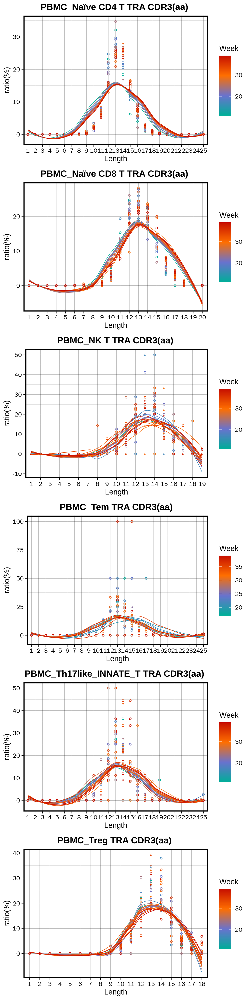

In [93]:
%%R -w 1500 -h 6000 -r 300 
PTRA=grid.arrange(grobs = TRAplot_list, ncol = 1)  
ggsave(plot=PTRA,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S26/S26_TRA.pdf")

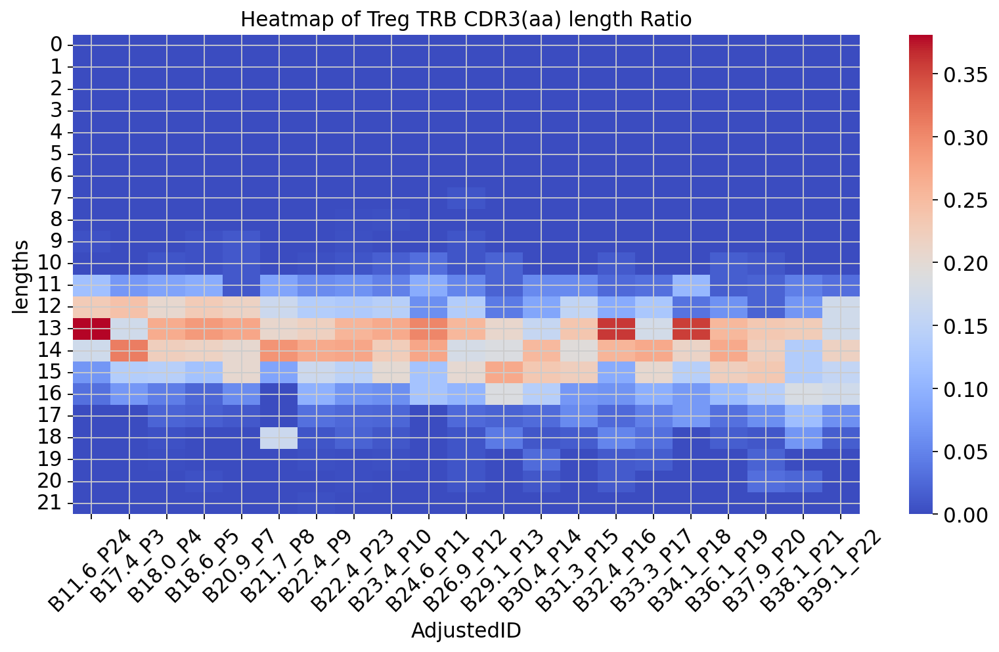

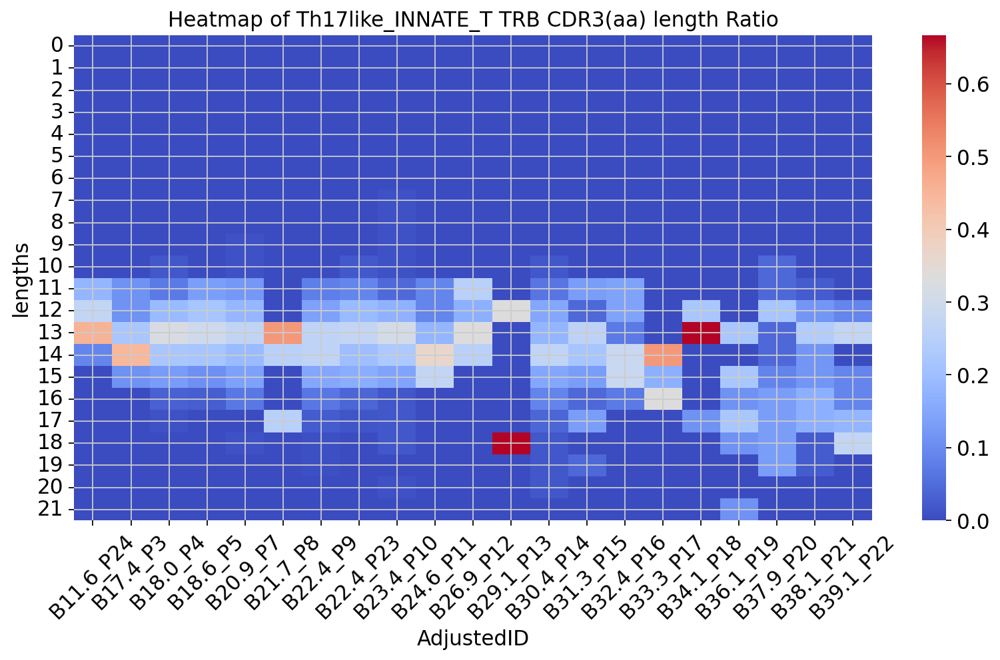

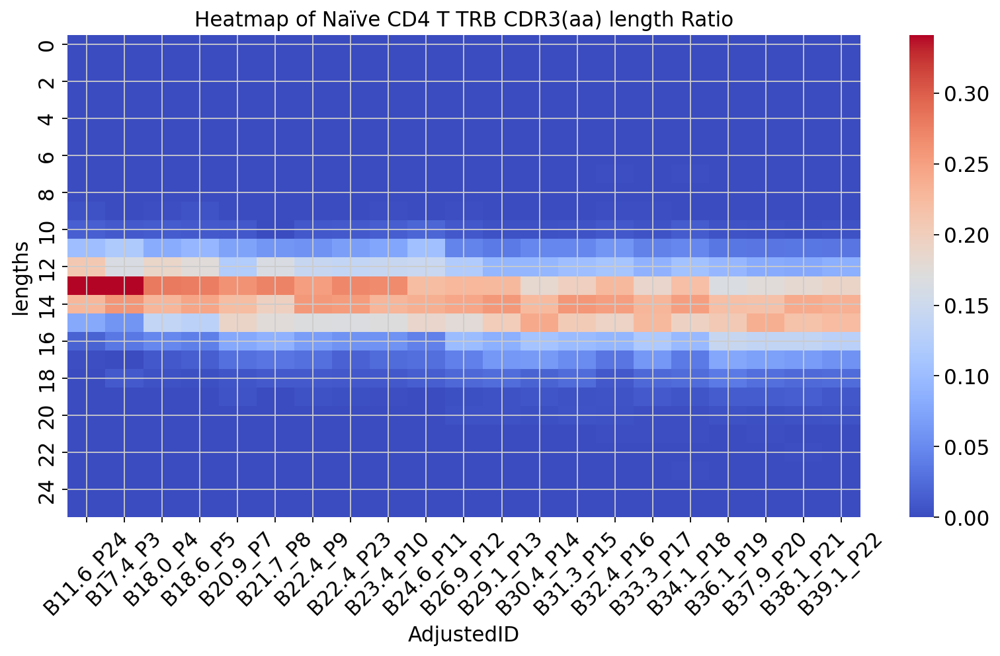

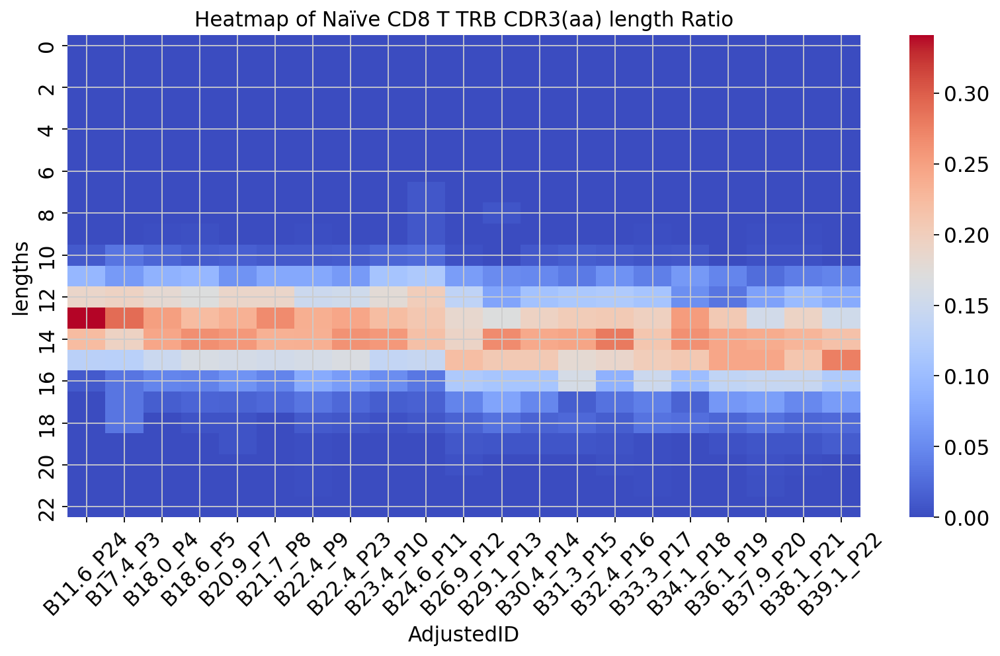

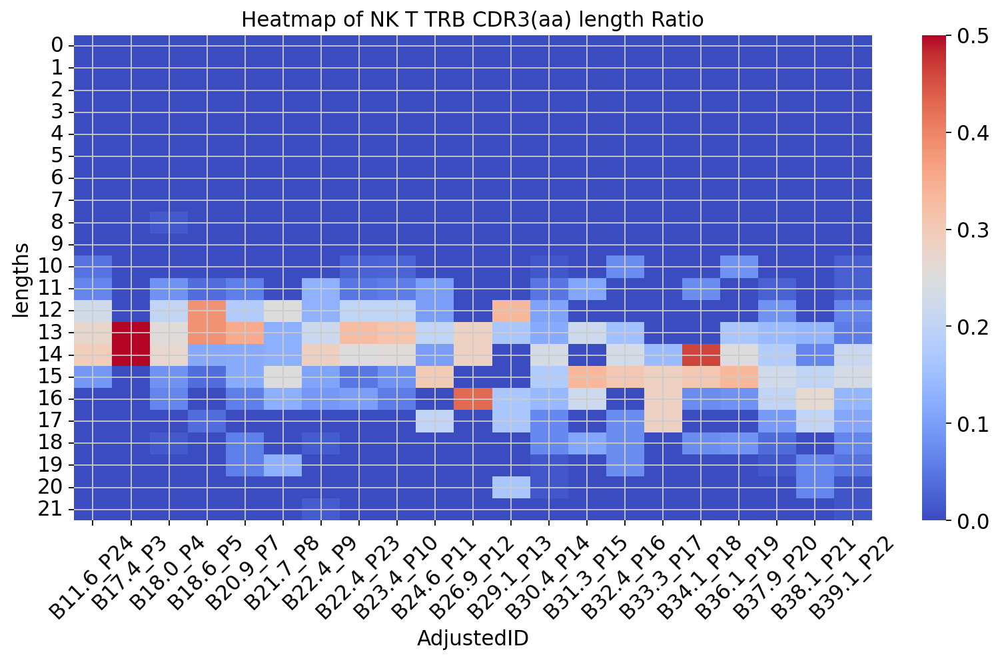

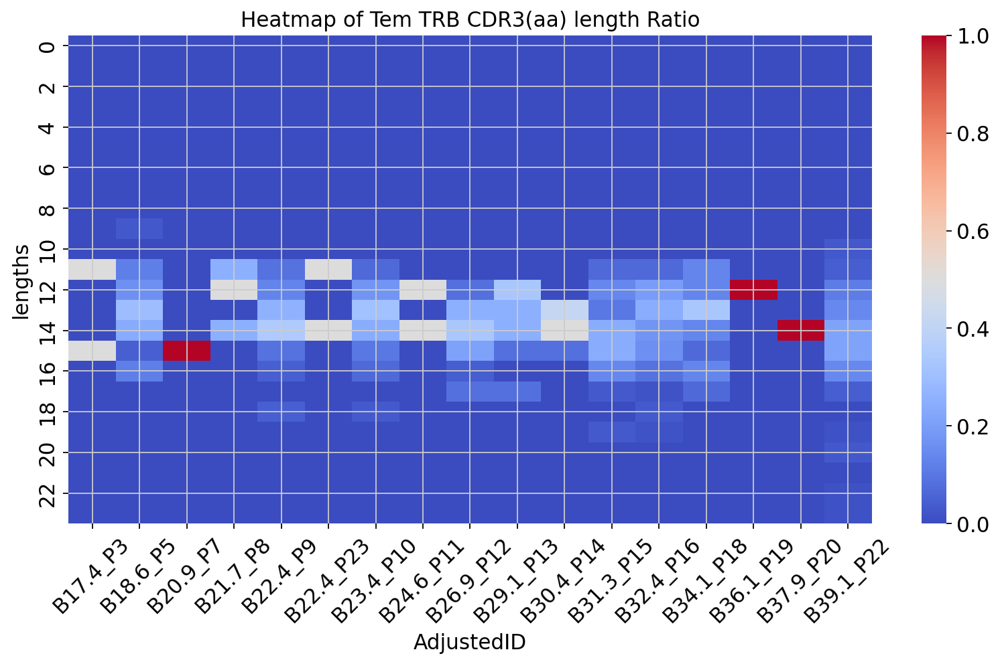

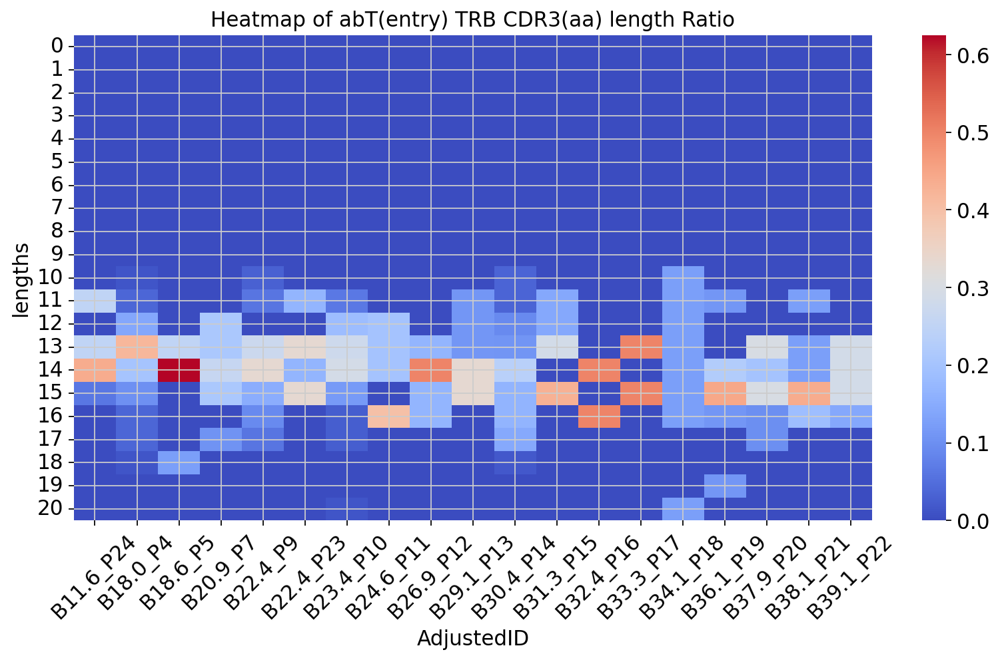

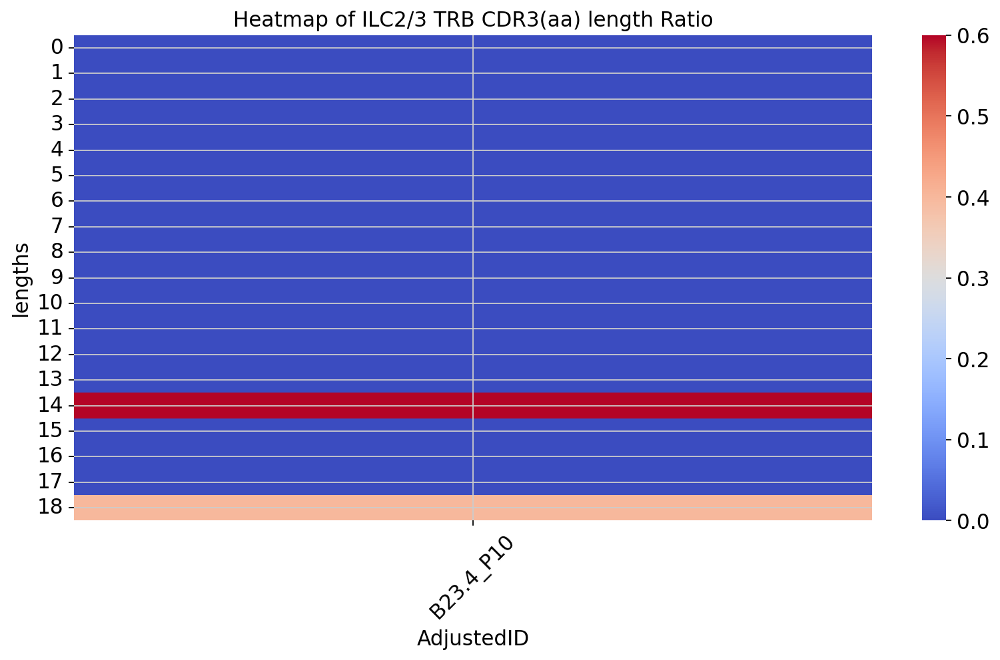

OSError: Cannot save file into a non-existent directory: '/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRB2/PBMC_ILC2'

In [37]:
PAths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRB2/PBMC_'
os.system('rm -rf '+PAths+'/*.csv')
for cell_type in unique_cell_types:
    cellratio=TCR_plot_heatmap_cell_type(adata_PBMC, cell_type,col='IR_VDJ_1_junction_aa',title='TRB')

    cellratio.to_csv(PAths+cell_type+'_ratio.csv')

In [105]:
%%R -w 2500 -h 2000 -r 300 
dir('/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRB2/')
library(tidyverse)
library(reshape2)
library(gridExtra)
plot_PBMC_sum_ratio_celltype <- function(PBMC_data, plot_title = 'BCR IGH CDR3(aa) in PBMC') {

  PBMC_sum_ratio <- melt(PBMC_data, id = c("lengths"))
  PBMC_sum_ratio$lengths <- factor(PBMC_sum_ratio$lengths, level = unique(PBMC_sum_ratio$lengths))

  colnames(PBMC_sum_ratio) <- c('Length', 'Sample', 'ratio')
  PBMC_sum_ratio$ratio <- PBMC_sum_ratio$ratio * 100
   PBMC_sum_ratio$Week <- as.numeric(substring(PBMC_sum_ratio$Sample,2,4))
    p <- ggplot(PBMC_sum_ratio, aes(Length, ratio, color = Week, group=Sample)) +
  geom_point(shape=1,size=1) +
#   geom_line() +
#   geom_smooth(se=F, method='gam') +
     geom_smooth(se=F,size=0.3) +
  ggtitle(plot_title) +
  theme_linedraw() +
  xlab('Length') +
  ylab('ratio(%)') +
  theme(plot.title = element_text(hjust = 0.5, size = 13, face = "bold"),
        panel.border = element_rect(linetype = "solid", colour = "black", size = 1.5))+
#     scale_color_gradientn(colours = rev(colorRampPalette(brewer.pal(9, "Spectral"))(100)))
  scale_color_gradientn(colours = rev(colorRampPalette(c("#C71000B2","#FF6F00B2","#6a73cf","#00AF99" ))(100)))
  return(p)
}

TRBplot_list <- list()
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRB2/'
# Adatalist=c("PBMC_abT(entry)_ratio.csv", "PBMC_Cycling Treg_ratio.csv", "PBMC_GNG4 +CD8aa+T_ratio.csv", "PBMC_Naïve CD4 T_ratio.csv", 
# "PBMC_Naïve CD8 T_ratio.csv", "PBMC_NK T_ratio.csv", "PBMC_Tem_ratio.csv", "PBMC_Th17like_INNATE_T_ratio.csv", "PBMC_Treg_ratio.csv")

Adatalist=c( "PBMC_Naïve CD4 T_ratio.csv", 
"PBMC_Naïve CD8 T_ratio.csv", "PBMC_NK T_ratio.csv", "PBMC_Tem_ratio.csv", "PBMC_Th17like_INNATE_T_ratio.csv", "PBMC_Treg_ratio.csv")

for (i in dir(paths)){
  print(i)
  name=gsub('_ratio.csv','',i)
  TCRdata=read.csv(paste0(paths,i))
  TCRdata<-TCRdata[rowSums(TCRdata)>0,]
  
  # 将每个绘制的图像存储在plot_list中
  TRBplot_list[[i]] <- plot_PBMC_sum_ratio_celltype(TCRdata, plot_title =paste0(name,' TRB CDR3(aa) '))
}


[1] "PBMC_abT(entry)_ratio.csv"
[1] "PBMC_Naïve CD4 T_ratio.csv"
[1] "PBMC_Naïve CD8 T_ratio.csv"
[1] "PBMC_NK T_ratio.csv"
[1] "PBMC_Tem_ratio.csv"
[1] "PBMC_Th17like_INNATE_T_ratio.csv"
[1] "PBMC_Treg_ratio.csv"


`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
Saving 5 x 20 in image


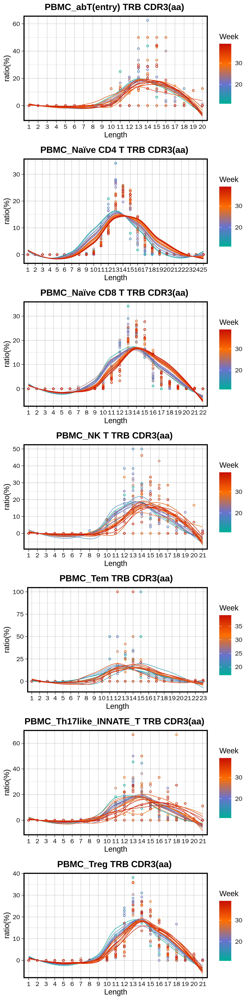

In [106]:
%%R -w 1500 -h 6000 -r 300 
PTRB=grid.arrange(grobs = TRBplot_list, ncol = 1)  
ggsave(plot=PTRB,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S26/S26_TRB.pdf")

In [35]:
import pandas as pd


TRBlong_ratio = TRB_ratio.reset_index().melt(id_vars='lengths', var_name='AdjustedID', value_name='proportion')
TRBlong_ratio['week'] = TRBlong_ratio['AdjustedID'].str.extract('B(\d+\.\d+)_P', expand=False).astype(float)

# print(df)
# TRBlong_ratio.rename(columns={'lengths': 'subject'}, inplace=True)

print(TRBlong_ratio )

     lengths AdjustedID  proportion  week
0          0  B11.6_P24    0.000000  11.6
1          1  B11.6_P24    0.000000  11.6
2          2  B11.6_P24    0.000000  11.6
3          3  B11.6_P24    0.000000  11.6
4          4  B11.6_P24    0.000000  11.6
..       ...        ...         ...   ...
541       21  B39.1_P22    0.000623  39.1
542       22  B39.1_P22    0.000934  39.1
543       23  B39.1_P22    0.000623  39.1
544       24  B39.1_P22    0.000000  39.1
545       25  B39.1_P22    0.000000  39.1

[546 rows x 4 columns]


In [36]:
###  Mixed Linear Model Regression Results
import statsmodels.api as sm
import statsmodels.formula.api as smf


TRBlong_ratio['time'] = TRBlong_ratio['week'].astype(float)


model = smf.mixedlm("proportion ~ time * lengths", TRBlong_ratio, groups=TRBlong_ratio['lengths'])
result = model.fit()
print(result.summary())



         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: proportion
No. Observations: 546     Method:             REML      
No. Groups:       26      Scale:              0.0003    
Min. group size:  21      Log-Likelihood:     1320.0107 
Max. group size:  21      Converged:          Yes       
Mean group size:  21.0                                  
--------------------------------------------------------
              Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------
Intercept      0.040    0.029  1.384 0.166 -0.017  0.096
time          -0.000    0.000 -2.444 0.015 -0.001 -0.000
lengths       -0.000    0.002 -0.055 0.956 -0.004  0.004
time:lengths   0.000    0.000  2.850 0.004  0.000  0.000
Group Var      0.005    0.091                           



/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [40]:
### 
import statsmodels.formula.api as smf


peak_TRBlong_ratio = TRBlong_ratio.groupby('time')['proportion'].idxmax()

peak_locs = TRBlong_ratio.loc[peak_TRBlong_ratio][['time', 'lengths']]

model = smf.ols(formula='lengths ~ time', data=peak_locs)
results = model.fit()


print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                lengths   R-squared:                       0.767
Model:                            OLS   Adj. R-squared:                  0.754
Method:                 Least Squares   F-statistic:                     59.33
Date:                  四, 14 12月 2023   Prob (F-statistic):           4.19e-07
Time:                        05:10:15   Log-Likelihood:                -4.8861
No. Observations:                  20   AIC:                             13.77
Df Residuals:                      18   BIC:                             15.76
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     11.7255      0.266     43.999      0.0

                            OLS Regression Results                            
Dep. Variable:                lengths   R-squared:                       0.767
Model:                            OLS   Adj. R-squared:                  0.754
Method:                 Least Squares   F-statistic:                     59.33
Date:                  四, 14 12月 2023   Prob (F-statistic):           4.19e-07
Time:                        05:39:23   Log-Likelihood:                -4.8861
No. Observations:                  20   AIC:                             13.77
Df Residuals:                      18   BIC:                             15.76
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     11.7255      0.266     43.999      0.0

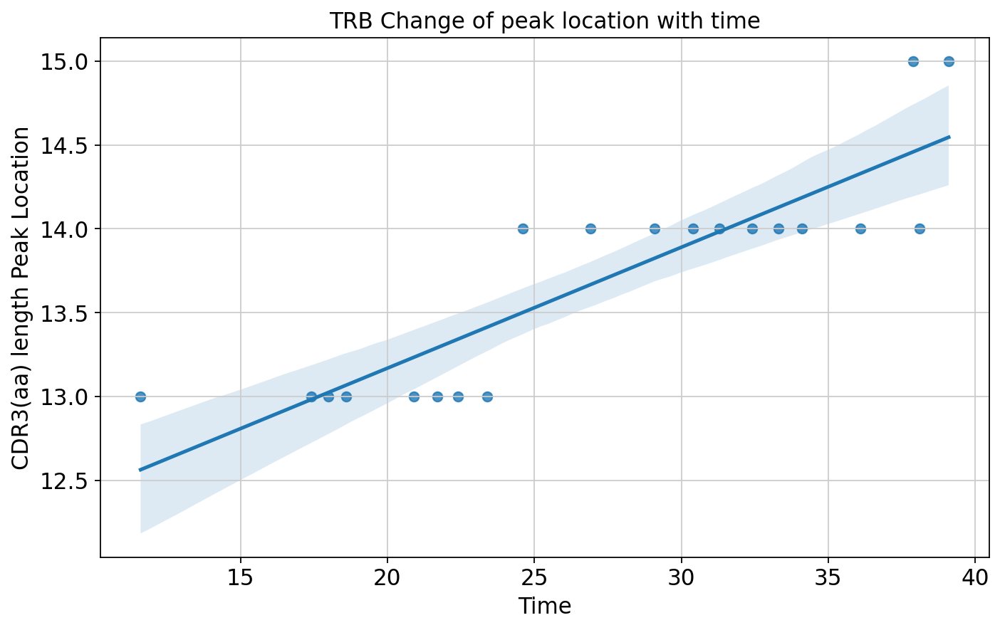

In [86]:
import statsmodels.formula.api as smf


peak_TRBlong_ratio = TRBlong_ratio.groupby('time')['proportion'].idxmax()


peak_locs = TRBlong_ratio.loc[peak_TRBlong_ratio][['time', 'lengths']]


model = smf.ols(formula='lengths ~ time', data=peak_locs)
results = model.fit()


print(results.summary())
plt.figure(figsize=(10, 6))
sns.regplot(x='time', y='lengths', data=peak_locs)
plt.title('TRB Change of peak location with time')
plt.xlabel('Time')
plt.ylabel('CDR3(aa) length Peak Location')
plt.show()

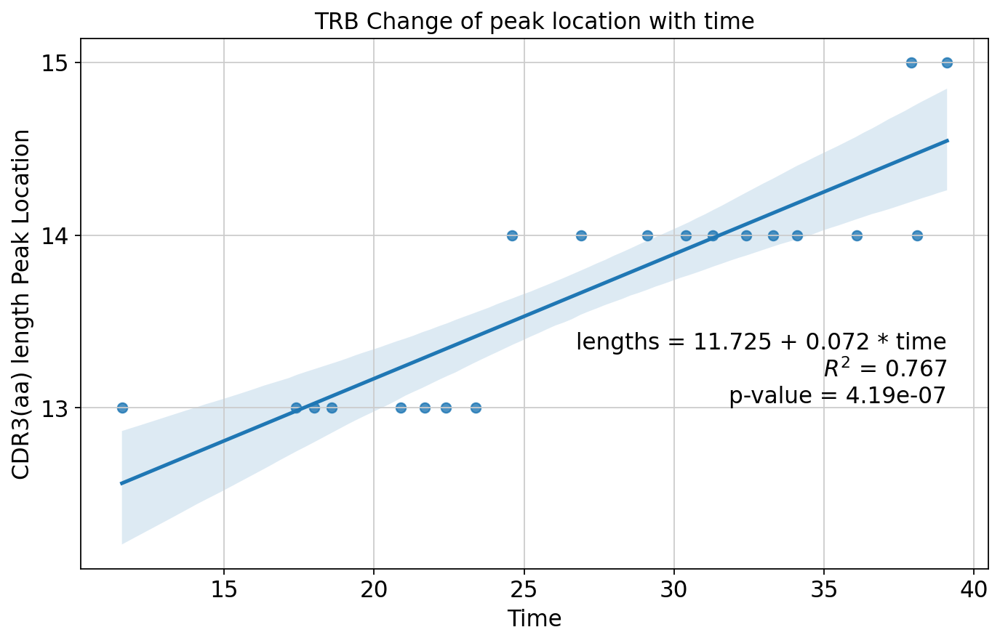

<Figure size 320x320 with 0 Axes>

In [87]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker


plt.figure(figsize=(10, 6))
sns.regplot(x='time', y='lengths', data=peak_locs, ci=95) # 默认会显示95%置信区间


plt.text(x=max(peak_locs['time']), y=min(peak_locs['lengths']),
         s=f'lengths = {results.params["Intercept"]:.3f} + {results.params["time"]:.3f} * time\n'
           f'$R^2$ = {results.rsquared:.3f}\n'
           f'p-value = {results.f_pvalue:.3g}', # 使用科学计数法格式化p-value
         horizontalalignment='right', verticalalignment='bottom')


plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))


plt.title('TRB Change of peak location with time')
plt.xlabel('Time')
plt.ylabel('CDR3(aa) length Peak Location')


plt.show()
plt.savefig('/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S28/S28_TRBpeak_location_change.png', dpi=300, bbox_inches='tight')

                            OLS Regression Results                            
Dep. Variable:                lengths   R-squared:                       0.290
Model:                            OLS   Adj. R-squared:                  0.251
Method:                 Least Squares   F-statistic:                     7.360
Date:                  四, 14 12月 2023   Prob (F-statistic):             0.0143
Time:                        05:26:34   Log-Likelihood:                -10.145
No. Observations:                  20   AIC:                             24.29
Df Residuals:                      18   BIC:                             26.28
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     12.4454      0.347     35.903      0.0

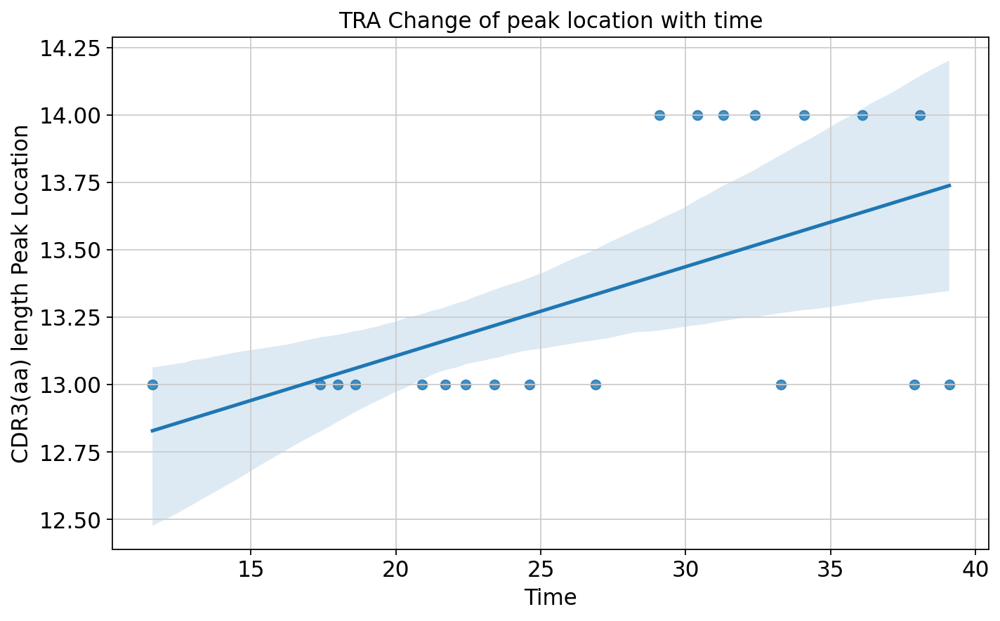

In [81]:
import statsmodels.formula.api as smf


peak_TRAlong_ratio = TRAlong_ratio.groupby('time')['proportion'].idxmax()


peak_locs = TRAlong_ratio.loc[peak_TRAlong_ratio][['time', 'lengths']]


model = smf.ols(formula='lengths ~ time', data=peak_locs)
results = model.fit()


print(results.summary())
plt.figure(figsize=(10, 6))
sns.regplot(x='time', y='lengths', data=peak_locs)
plt.title('TRA Change of peak location with time')
plt.xlabel('Time')
plt.ylabel('CDR3(aa) length Peak Location')
plt.show()

                            OLS Regression Results                            
Dep. Variable:                lengths   R-squared:                       0.290
Model:                            OLS   Adj. R-squared:                  0.251
Method:                 Least Squares   F-statistic:                     7.360
Date:                  四, 14 12月 2023   Prob (F-statistic):             0.0143
Time:                        05:40:52   Log-Likelihood:                -10.145
No. Observations:                  20   AIC:                             24.29
Df Residuals:                      18   BIC:                             26.28
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     12.4454      0.347     35.903      0.0

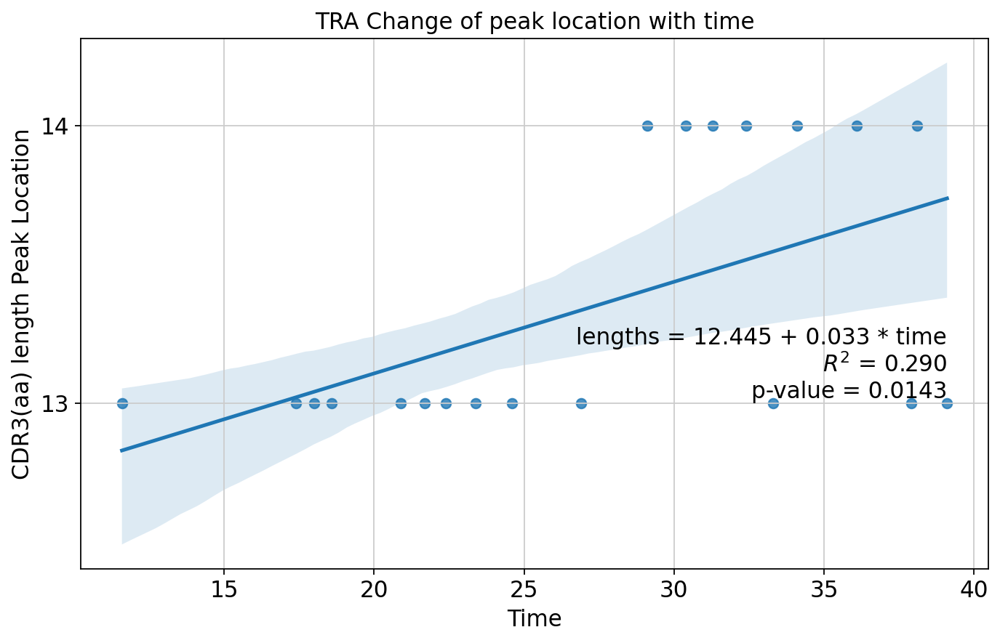

In [89]:
import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels.formula.api as smf


peak_TRAlong_ratio = TRAlong_ratio.groupby('time')['proportion'].idxmax()


peak_locs = TRAlong_ratio.loc[peak_TRAlong_ratio][['time', 'lengths']]

model = smf.ols(formula='lengths ~ time', data=peak_locs)
results = model.fit()
print(results.summary())


plt.figure(figsize=(10, 6))
sns.regplot(x='time', y='lengths', data=peak_locs, ci=95) # 默认会显示95%置信区间


plt.text(x=max(peak_locs['time']), y=min(peak_locs['lengths']),
         s=f'lengths = {results.params["Intercept"]:.3f} + {results.params["time"]:.3f} * time\n'
           f'$R^2$ = {results.rsquared:.3f}\n'
           f'p-value = {results.f_pvalue:.3g}', # 使用科学计数法格式化p-value
         horizontalalignment='right', verticalalignment='bottom')


plt.gca().yaxis.set_major_locator(ticker.MaxNLocator(integer=True))


plt.title('TRA Change of peak location with time')
plt.xlabel('Time')
plt.ylabel('CDR3(aa) length Peak Location')


plt.savefig('/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S28/S28_TRApeak_location_change.png', dpi=300, bbox_inches='tight')
plt.show()

In [42]:
def calculate_correlation(df):
    from scipy import stats
    results = []

    grouped = df.groupby('lengths')

    for name, group in grouped:
        correlation, p_value = stats.spearmanr(group['week'], group['proportion'])
    
        results.append({
            'lengths': name,
            'R_value': correlation,
            'p_value': p_value
        })

 
    results_df = pd.DataFrame(results)

    return results_df


TRBresults_df = calculate_correlation(TRBlong_ratio)
print(TRBresults_df)

    lengths   R_value       p_value
0         0       NaN           NaN
1         1       NaN           NaN
2         2       NaN           NaN
3         3       NaN           NaN
4         4       NaN           NaN
5         5  0.073879  7.502878e-01
6         6       NaN           NaN
7         7  0.193635  4.003394e-01
8         8  0.029733  8.981983e-01
9         9 -0.297489  1.903057e-01
10       10 -0.580708  5.775258e-03
11       11 -0.865866  3.960261e-07
12       12 -0.941215  2.114874e-10
13       13 -0.905489  1.669853e-08
14       14 -0.159143  4.907993e-01
15       15  0.907438  1.380728e-08
16       16  0.913933  7.098832e-09
17       17  0.902241  2.272088e-08
18       18  0.833388  2.719194e-06
19       19  0.874147  2.235775e-07
20       20  0.808777  9.087501e-06
21       21  0.610159  3.311655e-03
22       22  0.638010  1.858797e-03
23       23  0.437677  4.722548e-02
24       24  0.139744  5.457425e-01
25       25  0.127453  5.819398e-01


/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


In [43]:
TRA_ratio
import pandas as pd


TRAlong_ratio = TRA_ratio.reset_index().melt(id_vars='lengths', var_name='AdjustedID', value_name='proportion')
TRAlong_ratio['week'] = TRAlong_ratio['AdjustedID'].str.extract('B(\d+\.\d+)_P', expand=False).astype(float)

# print(df)
# TRAlong_ratio.rename(columns={'lengths': 'subject'}, inplace=True)

print(TRAlong_ratio )

import statsmodels.api as sm
import statsmodels.formula.api as smf


TRAlong_ratio['time'] = TRAlong_ratio['week'].astype(float)


model = smf.mixedlm("proportion ~ time * lengths", TRAlong_ratio, groups=TRAlong_ratio['lengths'])
result = model.fit()
print(result.summary())



     lengths AdjustedID  proportion  week
0          0  B11.6_P24    0.000000  11.6
1          1  B11.6_P24    0.000000  11.6
2          2  B11.6_P24    0.000000  11.6
3          3  B11.6_P24    0.000000  11.6
4          4  B11.6_P24    0.000000  11.6
..       ...        ...         ...   ...
541       21  B39.1_P22    0.000000  39.1
542       22  B39.1_P22    0.000000  39.1
543       23  B39.1_P22    0.000000  39.1
544       24  B39.1_P22    0.000000  39.1
545       25  B39.1_P22    0.000311  39.1

[546 rows x 4 columns]
         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: proportion
No. Observations: 546     Method:             REML      
No. Groups:       26      Scale:              0.0001    
Min. group size:  21      Log-Likelihood:     1631.4824 
Max. group size:  21      Converged:          Yes       
Mean group size:  21.0                                  
--------------------------------------------------------
              Coef.  Std.E

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [44]:

import pandas as pd
from scipy import stats
results = []

grouped = TRAlong_ratio.groupby('lengths')

for name, group in grouped:

    correlation, p_value = stats.spearmanr(group['week'], group['proportion'])
    
    results.append({
        'lengths': name,
        'R_value': correlation,
        'p_value': p_value
    })

TRAresults_df = pd.DataFrame(results)

print(TRAresults_df)

    lengths   R_value   p_value
0         0       NaN       NaN
1         1       NaN       NaN
2         2       NaN       NaN
3         3       NaN       NaN
4         4       NaN       NaN
5         5  0.407850  0.066461
6         6  0.519507  0.015795
7         7  0.247475  0.279445
8         8 -0.142718  0.537141
9         9  0.109776  0.635722
10       10 -0.645664  0.001571
11       11 -0.757389  0.000070
12       12 -0.793764  0.000017
13       13 -0.781423  0.000029
14       14  0.596298  0.004331
15       15  0.799610  0.000014
16       16  0.797662  0.000015
17       17  0.832738  0.000003
18       18  0.720364  0.000231
19       19  0.610732  0.003274
20       20  0.498769  0.021360
21       21       NaN       NaN
22       22  0.073879  0.750288
23       23 -0.258576  0.257732
24       24       NaN       NaN
25       25  0.119476  0.605969


/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


In [45]:
%%R -i TRAlong_ratio


# 加载必要的库
library(dplyr)
library(purrr)
library(tidyr)
library(broom)

# 对TRAlong_ratio按照'lengths'进行分组，然后在每个组上计算'week'和'proportion'之间的Spearman相关性
TRAresults_df <- TRAlong_ratio %>%
  group_by(lengths) %>%
  nest() %>% 
  mutate(correlation = map(data, ~cor.test(.x$week, .x$proportion, method = "spearman")) %>% map(broom::tidy)) %>%
  unnest(correlation) %>%
  select(lengths, estimate, p.value)

# 打印结果
print(TRAresults_df)

# A tibble: 26 × 3
# Groups:   lengths [26]
   lengths estimate p.value
     <int>    <dbl>   <dbl>
 1       0   NA     NA     
 2       1   NA     NA     
 3       2   NA     NA     
 4       3   NA     NA     
 5       4   NA     NA     
 6       5    0.408  0.0665
 7       6    0.520  0.0158
 8       7    0.247  0.279 
 9       8   -0.143  0.537 
10       9    0.110  0.636 
# ℹ 16 more rows
# ℹ Use `print(n = ...)` to see more rows


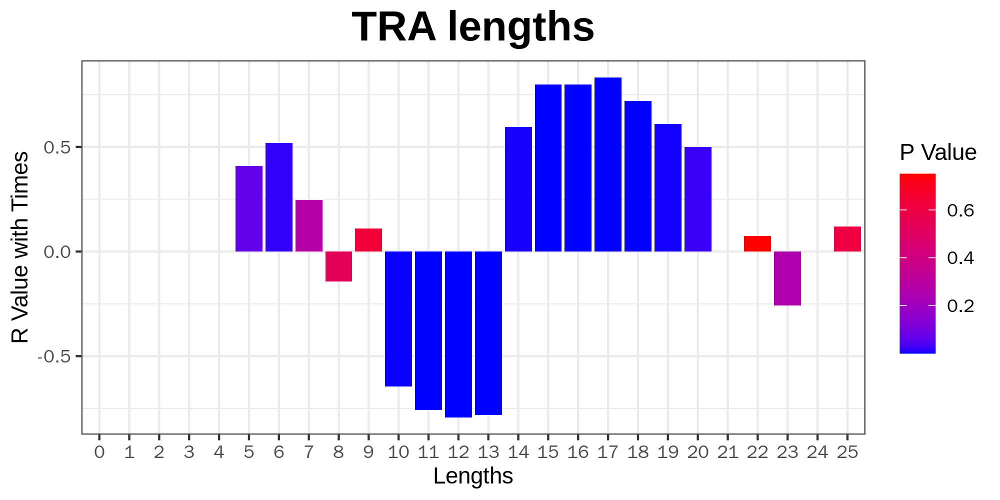

In [46]:
%%R -w 2000 -h 1000 -r 300 -i TRAresults_df
library(ggplot2)

# TRAresults_df<- na.omit(TRAresults_df)

ggplot(TRAresults_df, aes(x = factor(lengths), y = R_value, fill = p_value)) +
    geom_bar(stat = "identity") +
    scale_fill_gradient(low = "blue", high = "red") +
    labs(x = "Lengths", y = "R Value with Times", fill = "P Value") +
    theme_bw()+ggtitle("TRA lengths")+ 
theme(plot.title = element_text(hjust = 0.5, size = 20, face = "bold"))


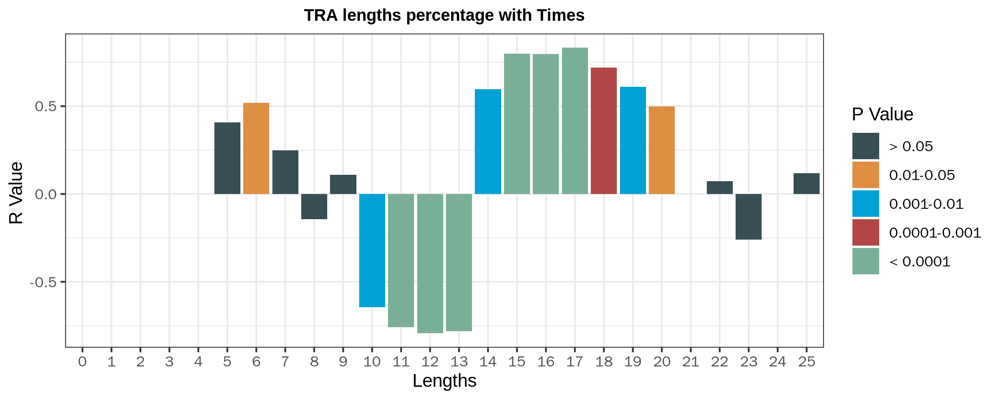

In [47]:
%%R -w 2500 -h 1000 -r 300 -i TRAresults_df
library(ggsci)
TRAresults_df$pvalue_cat <- cut(TRAresults_df$p_value,
                                breaks = c(0, 0.0001, 0.001, 0.01, 0.05, Inf),
                                labels = c('< 0.0001', '0.0001-0.001', '0.001-0.01', '0.01-0.05', '> 0.05'),
                                include.lowest = TRUE)
TRAresults_df$pvalue_cat<-factor(TRAresults_df$pvalue_cat,level=rev( c('< 0.0001', '0.0001-0.001', '0.001-0.01', '0.01-0.05', '> 0.05')))

colors <- c('< 0.0001' = '#F6313E', '0.0001-0.001' = '#FF7F50', '0.001-0.01' = "#f6c619", '0.01-0.05' = "#999933", '> 0.05' = '#00AF99')


ggplot(TRAresults_df, aes(x = factor(lengths), y = R_value, fill = pvalue_cat)) +
    geom_bar(stat = "identity") +
       scale_fill_jama()+
    labs(x = "Lengths", y = "R Value ", fill = "P Value") +
    theme_bw() +
    ggtitle("TRA lengths percentage with Times") + 
    theme(plot.title = element_text(hjust = 0.5, size = 10, face = "bold"))

Saving 8.33 x 3.33 in image


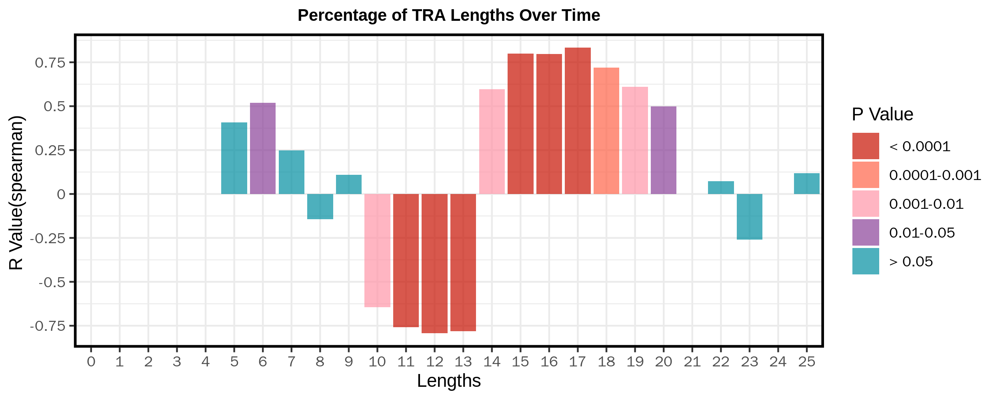

In [94]:
%%R -w 2500 -h 1000 -r 300 -i TRAresults_df
create_pval_plot <- function(df,titlex) {
 
  df$pvalue_cat <- cut(df$p_value,
                       breaks = c(0, 0.0001, 0.001, 0.01, 0.05, Inf),
                       
                       labels = c('< 0.0001', '0.0001-0.001', '0.001-0.01',
                                  '0.01-0.05', '> 0.05'),
                       include.lowest = TRUE)

  
  colors <- c('< 0.0001' = "#C71000B2", '0.0001-0.001' =  "#FF6348B2", 
              '0.001-0.01' = "#FF95A8B2", '0.01-0.05' = "#8A4198B2" ,
              '> 0.05' ="#008EA0B2" )

 
  plot <- ggplot(df, aes(x = factor(lengths), y = R_value, fill = pvalue_cat)) +
      geom_bar(stat = "identity") +
      scale_fill_manual(values = colors) +
      labs(x = "Lengths", y = "R Value(spearman) ", fill = "P Value") +
      theme_bw() +
      ggtitle(titlex) + 
      theme(plot.title = element_text(hjust = 0.5, size = 10, face = "bold"),
           panel.border = element_rect(linetype = "solid", colour = "black", size = 1.5)) + 
      scale_y_continuous(breaks = seq(-1, 1, by = 0.25), labels = seq(-1, 1, by = 0.25),)
  
  return(plot)
}


TRApval_plot <- create_pval_plot(
    TRAresults_df,titlex="Percentage of TRA Lengths Over Time")
print(TRApval_plot)
ggsave(plot=TRApval_plot,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/Figure4D_TRApvalue.pdf")

In [ ]:
%%R
head(TRAresults_df)

In [ ]:
TRAlong_ratio

In [49]:
%%R
source('/home/maolp/mao/Codeman/Project/Main_Gao_ScanpyProject/Mainrun.R')
Dfcalculate_correlation(TRAlong_ratio, "lengths", "week", "proportion")

# A tibble: 26 × 3
# Groups:   lengths [26]
   lengths R_value p_value
     <int>   <dbl>   <dbl>
 1       0  NA     NA     
 2       1  NA     NA     
 3       2  NA     NA     
 4       3  NA     NA     
 5       4  NA     NA     
 6       5   0.408  0.0665
 7       6   0.520  0.0158
 8       7   0.247  0.279 
 9       8  -0.143  0.537 
10       9   0.110  0.636 
# ℹ 16 more rows
# ℹ Use `print(n = ...)` to see more rows


In [101]:
%%R -w 2500 -h 2000 -r 300 
dir('/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRB2/')
library(tidyverse)
library(reshape2)
library(gridExtra)
TRBplot_list <- list()
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRB2/'
# Adatalist=c("PBMC_abT(entry)_ratio.csv", "PBMC_Cycling Treg_ratio.csv", "PBMC_GNG4 +CD8aa+T_ratio.csv", "PBMC_Naïve CD4 T_ratio.csv", 
# "PBMC_Naïve CD8 T_ratio.csv", "PBMC_NK T_ratio.csv", "PBMC_Tem_ratio.csv", "PBMC_Th17like_INNATE_T_ratio.csv", "PBMC_Treg_ratio.csv")

Adatalist=c( "PBMC_Naïve CD4 T_ratio.csv", 
"PBMC_Naïve CD8 T_ratio.csv", "PBMC_NK T_ratio.csv", 
            "PBMC_Tem_ratio.csv", "PBMC_Th17like_INNATE_T_ratio.csv", "PBMC_Treg_ratio.csv")
plot_list=list()
for (i in dir(paths)){
  print(i)
  name=gsub('_ratio.csv','',i)
  TCRdata=read.csv(paste0(paths,i))
  TCRdata<-TCRdata[rowSums(TCRdata)>0,]
#   print(head(plot_Cell_sum_ratio_celltype(TCRdata)))
  
  TRBtem <- plot_Cell_sum_ratio_celltype(TCRdata)
#   print(Dfcalculate_correlation(TRBtem , "lengths", "week", "proportion"))
  TRBtem2 <- Dfcalculate_correlation(TRBtem , "lengths", "week", "proportion")

  TRBtem3 <- create_pval_plot(TRBtem2,paste0(name,' TRB'))  
#   print(TRBtem3)
 plot_list[[i]] <- create_pval_plot(TRBtem2,paste0(name,' TRB CDR3(aa)'))  
}


[1] "PBMC_abT(entry)_ratio.csv"
[1] "PBMC_Naïve CD4 T_ratio.csv"
[1] "PBMC_Naïve CD8 T_ratio.csv"
[1] "PBMC_NK T_ratio.csv"
[1] "PBMC_Tem_ratio.csv"
[1] "PBMC_Th17like_INNATE_T_ratio.csv"
[1] "PBMC_Treg_ratio.csv"


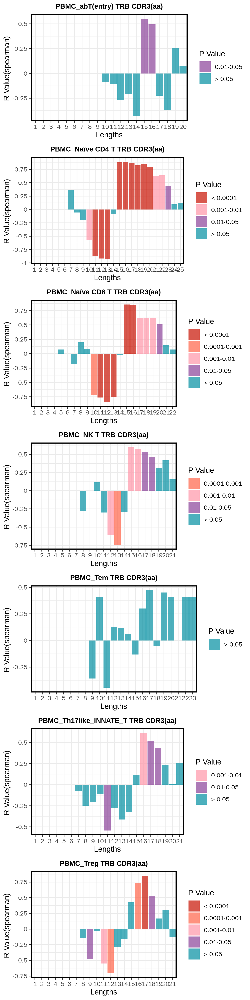

In [102]:
%%R -w 1500 -h 6000 -r 300 
PTRBallvalue=grid.arrange(grobs = plot_list, ncol = 1)  
ggsave(plot=PTRBallvalue,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S26/S26_TRB_Pvalue.pdf",width=8,height=30)

In [ ]:
# # %%R
# plot_Cell_sum_ratio_celltype <- function(Cell_data) {

#   Cell_sum_ratio <- melt(Cell_dQata, id = c("lengths"))
#   Cell_sum_ratio$lengths <- factor(Cell_sum_ratio$lengths, level = unique(Cell_sum_ratio$lengths))

#   colnames(Cell_sum_ratio) <- c('lengths', 'Sample', 'ratio')
#   Cell_sum_ratio$ratio <- Cell_sum_ratio$ratio * 100
# Cell_sum_ratio$proportion<- Cell_sum_ratio$ratio * 100
#    Cell_sum_ratio$week <- as.numeric(substring(Cell_sum_ratio$Sample,2,4))
# Cell_sum_ratio$time <-as.numeric(Cell_sum_ratio$week)
  
#   return(Cell_sum_ratio)
# }

Saving 8.33 x 3.33 in image


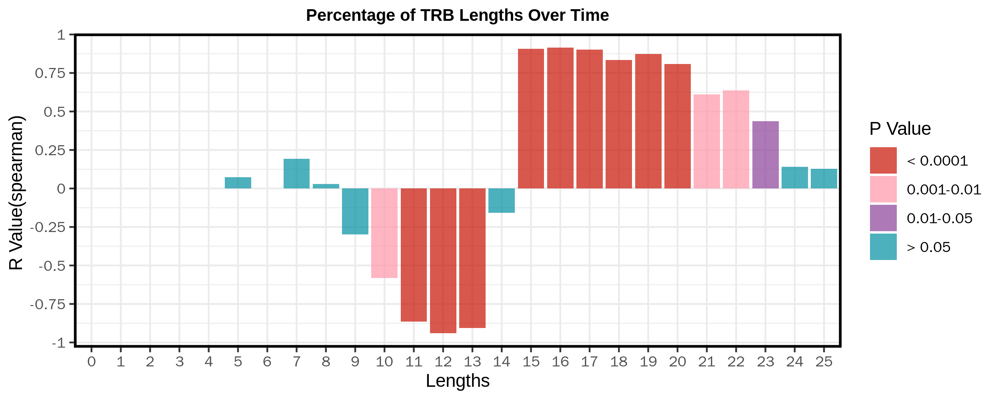

In [109]:
%%R -w 2500 -h 1000 -r 300 -i TRBresults_df
TRBpval_plot <- create_pval_plot(
    TRBresults_df,titlex="Percentage of TRB Lengths Over Time")
print(TRBpval_plot)
ggsave(plot=TRBpval_plot,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Main_Figure4/Figure4D_TRBpvalue.pdf")

In [107]:
%%R -w 2500 -h 2000 -r 300 
dir('/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRA2/')
library(tidyverse)
library(reshape2)
library(gridExtra)
TRAplot_pvalue <- list()
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRA2/'
# Adatalist=c("PBMC_abT(entry)_ratio.csv", "PBMC_Cycling Treg_ratio.csv", "PBMC_GNG4 +CD8aa+T_ratio.csv", "PBMC_Naïve CD4 T_ratio.csv", 
# "PBMC_Naïve CD8 T_ratio.csv", "PBMC_NK T_ratio.csv", "PBMC_Tem_ratio.csv", "PBMC_Th17like_INNATE_T_ratio.csv", "PBMC_Treg_ratio.csv")

Adatalist=c( "PBMC_Naïve CD4 T_ratio.csv", 
"PBMC_Naïve CD8 T_ratio.csv", "PBMC_NK T_ratio.csv", 
            "PBMC_Tem_ratio.csv", "PBMC_Th17like_INNATE_T_ratio.csv", "PBMC_Treg_ratio.csv")
plot_list=list()
for (i in Adatalist){
  print(i)
  name=gsub('_ratio.csv','',i)
  TCRdata=read.csv(paste0(paths,i))
  TCRdata<-TCRdata[rowSums(TCRdata)>0,]
#   print(head(plot_Cell_sum_ratio_celltype(TCRdata)))
  
  TRAtem <- plot_Cell_sum_ratio_celltype(TCRdata)
#   print(Dfcalculate_correlation(TRAtem , "lengths", "week", "proportion"))
  TRAtem2 <- Dfcalculate_correlation(TRAtem , "lengths", "week", "proportion")

  TRAtem3 <- create_pval_plot(TRAtem2,paste0(name,' TRA'))  
#   print(TRAtem3)
 TRAplot_pvalue[[i]] <- create_pval_plot(TRAtem2,paste0(name,' TRA CDR3(aa)'))  
}


[1] "PBMC_Naïve CD4 T_ratio.csv"
[1] "PBMC_Naïve CD8 T_ratio.csv"
[1] "PBMC_NK T_ratio.csv"
[1] "PBMC_Tem_ratio.csv"
[1] "PBMC_Th17like_INNATE_T_ratio.csv"
[1] "PBMC_Treg_ratio.csv"


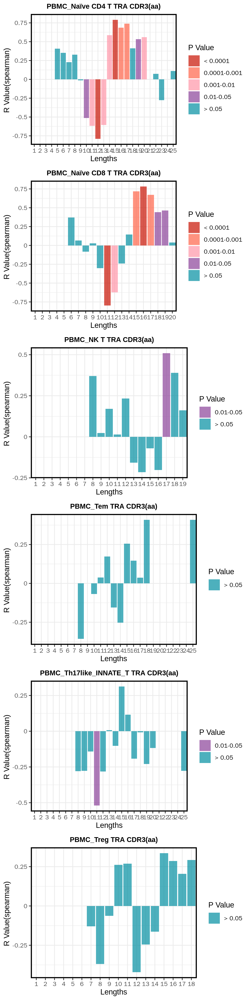

In [112]:
%%R -w 1500 -h 6000 -r 300 
PTRAallvalue=grid.arrange(grobs = TRAplot_pvalue, ncol = 1)  
ggsave(plot=PTRAallvalue,"/home/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S26/S26_TRA_Pvalue.pdf",width=6,height=25)

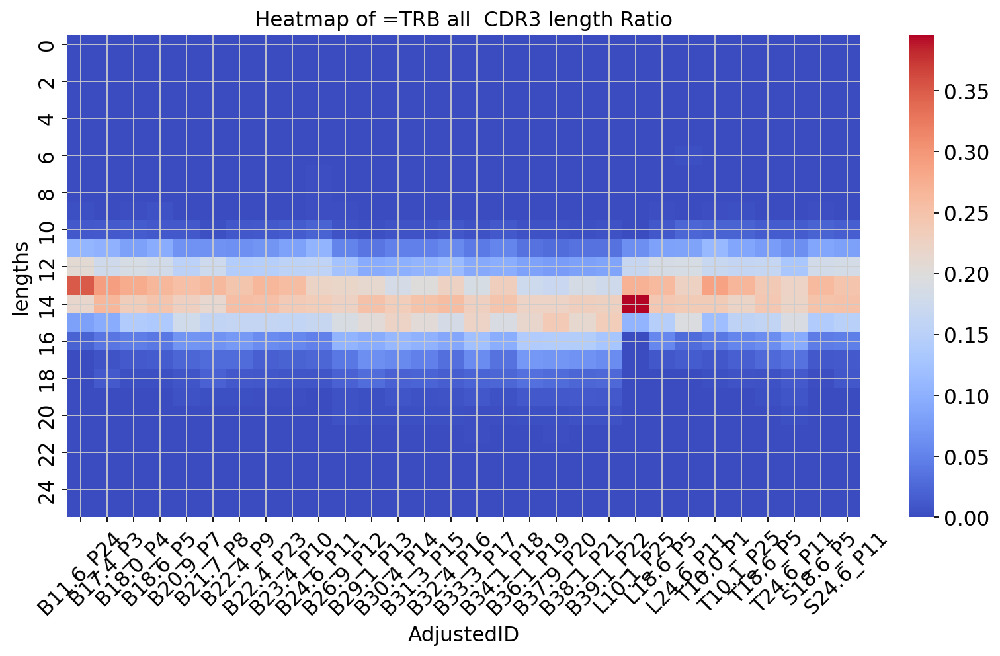

In [56]:
TRB_ratio_all=TCR_All_plot_heatmap(adata,col='IR_VDJ_1_junction_aa',title='=TRB all')

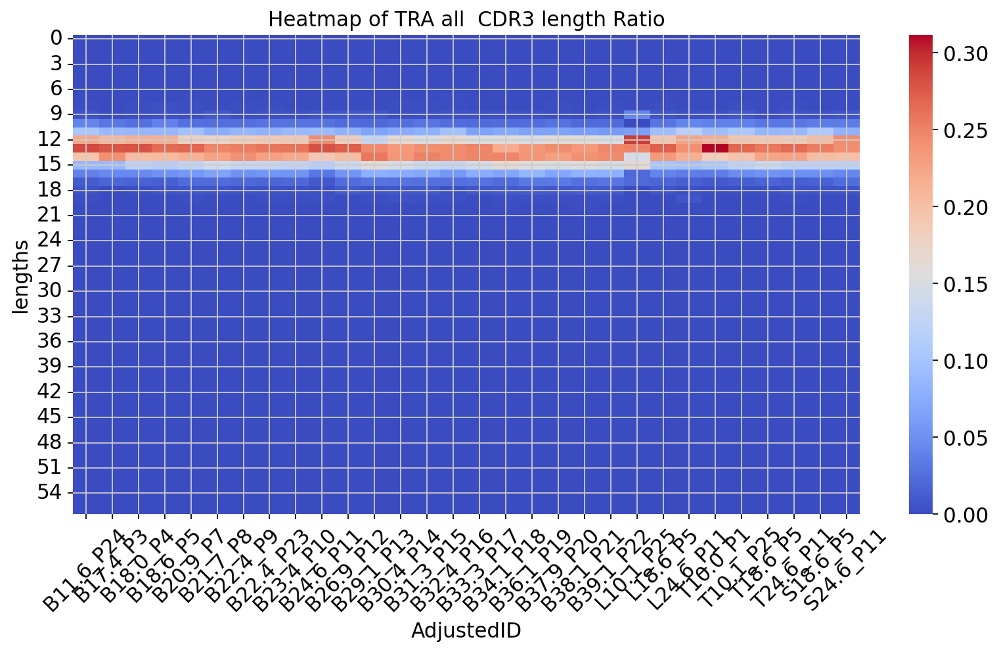

In [57]:
TRA_ratio_all=TCR_All_plot_heatmap(adata,col='IR_VJ_1_junction_aa',title='TRA all')

In [58]:
%%R -w 2400 -h 1000 -r 300 -i TRA_ratio_all
library(tidyverse)
library(reshape2)
library(ggplot2)
library(dplyr)
library(RColorBrewer )
Cal_PBMC_sum_ratio <- function(PBMC_sums_ratio, plot_title ) {
  PBMC_sum_ratio <- rownames_to_column(PBMC_sums_ratio)
  PBMC_sum_ratio <- melt(PBMC_sum_ratio, id = c("rowname"))
  PBMC_sum_ratio$rowname <- factor(PBMC_sum_ratio$rowname, level = unique(PBMC_sum_ratio$rowname))

  colnames(PBMC_sum_ratio) <- c('Length', 'Sample', 'ratio')
  PBMC_sum_ratio$ratio <- PBMC_sum_ratio$ratio * 100
  
 PBMC_sum_ratio$Week <- as.numeric(substring(PBMC_sum_ratio$Sample,2,5))
    PBMC_sum_ratio <- PBMC_sum_ratio %>% group_by(Length) %>% filter(sum(as.numeric(ratio) )!= 0) %>%ungroup()
     PBMC_sum_ratio$Organ <- substring(PBMC_sum_ratio$Sample,1,1)
return( PBMC_sum_ratio)
}

TRA_ratio_alllong <- Cal_PBMC_sum_ratio(TRA_ratio_all)

head(TRA_ratio_alllong)

# A tibble: 6 × 5
  Length Sample    ratio  Week Organ
  <fct>  <fct>     <dbl> <dbl> <chr>
1 5      B11.6_P24 0      11.6 B    
2 6      B11.6_P24 0      11.6 B    
3 7      B11.6_P24 0      11.6 B    
4 8      B11.6_P24 0.126  11.6 B    
5 9      B11.6_P24 0.506  11.6 B    
6 10     B11.6_P24 4.05   11.6 B    


In [59]:
%%R -i TRB_ratio_all
TRB_ratio_alllong <- Cal_PBMC_sum_ratio(TRB_ratio_all)
head(TRB_ratio_alllong)

# A tibble: 6 × 5
  Length Sample    ratio  Week Organ
  <fct>  <fct>     <dbl> <dbl> <chr>
1 5      B11.6_P24 0      11.6 B    
2 6      B11.6_P24 0      11.6 B    
3 7      B11.6_P24 0      11.6 B    
4 8      B11.6_P24 0      11.6 B    
5 9      B11.6_P24 0.379  11.6 B    
6 10     B11.6_P24 1.14   11.6 B    


[1] FALSE


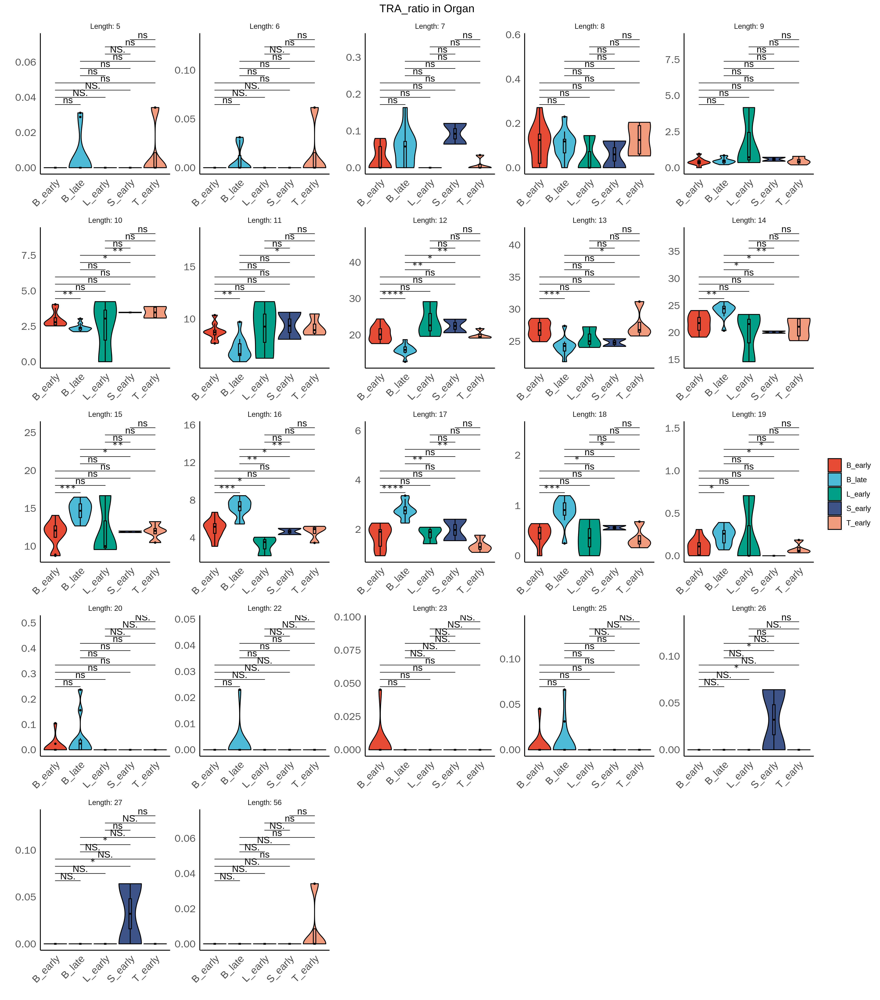

In [70]:
%%R -w 4400 -h 5000 -r 300 


library(ggsci)
library(tidyverse)
library(ggplot2)
library(ggpubr)


TRA_ratio_alllong <- TRA_ratio_alllong %>%
  mutate(Date = ifelse(Week > 26, "late", "early"),
         Organdate = paste(Organ, Date, sep = "_"))





levels <- unique(TRA_ratio_alllong$Organdate)



elements <- c("B_early", "B_late", "L_early", "S_early", "T_early")

combinations <- combn(elements, 2)

my_comparisons <- apply(combinations, 2, function(x) list(x[1], x[2]))



# my_comparisons <- apply(combinations, 2, function(x) {list(x[1], x[2])})
my_comparisons <- list(c("B_early", "B_late"))
my_comparisons <- list(
  c("B_early", "B_late"),
  c("B_early", "L_early"),
  c("B_early", "S_early"),
  c("B_early", "T_early"),
  c("B_late", "L_early"),
  c("B_late", "S_early"),
  c("B_late", "T_early"),
  c("L_early", "S_early"),
  c("L_early", "T_early"),
  c("S_early", "T_early")
)
p <- ggplot(TRA_ratio_alllong, aes(x = Organdate, y = ratio, fill = Organdate)) +
  geom_violin(position = position_dodge(width = 1), scale = 'width', color = "black") +
  geom_boxplot(position = position_dodge(width = 1), outlier.size = 0.7, width = 0.1, show.legend = FALSE, color = "black") +
  stat_compare_means(comparisons = my_comparisons, label = "p.signif", tip.length = 0) +
  facet_wrap(~Length, scales = "free", labeller = label_both) +  
  theme_minimal() +
  theme(panel.grid = element_blank(), 
        panel.background = element_blank(), 
        panel.border = element_blank(),
        axis.line = element_line(color = "black"),
        axis.text.x = element_text(size = 12, angle = 45, hjust = 1), 
        axis.text.y = element_text(size = 12),
        plot.title = element_text(hjust = 0.5),
        legend.title = element_blank(), 
        legend.key = element_blank()) +
  labs(x = '', y = '', title = 'TRA_ratio in Organ')+scale_fill_npg()


print(p)

[1] FALSE


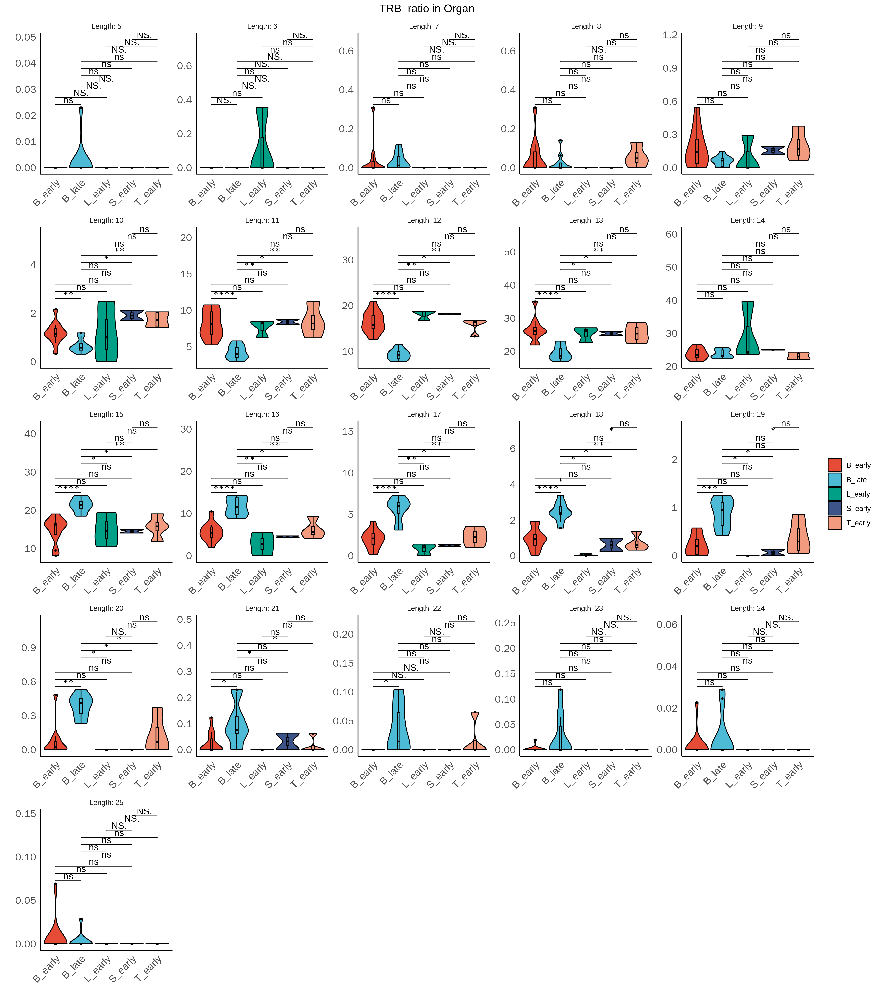

In [71]:
%%R -w 4400 -h 5000 -r 300 


library(ggsci)
library(tidyverse)
library(ggplot2)
library(ggpubr)


TRB_ratio_alllong <- TRB_ratio_alllong %>%
  mutate(Date = ifelse(Week > 28, "late", "early"),
         Organdate = paste(Organ, Date, sep = "_"))





levels <- unique(TRB_ratio_alllong$Organdate)



elements <- c("B_early", "B_late", "L_early", "S_early", "T_early")

combinations <- combn(elements, 2)

my_comparisons <- apply(combinations, 2, function(x) list(x[1], x[2]))

# 打印结果
# print(my_comparisons)


# my_comparisons <- apply(combinations, 2, function(x) {list(x[1], x[2])})
my_comparisons <- list(c("B_early", "B_late"))
my_comparisons <- list(
  c("B_early", "B_late"),
  c("B_early", "L_early"),
  c("B_early", "S_early"),
  c("B_early", "T_early"),
  c("B_late", "L_early"),
  c("B_late", "S_early"),
  c("B_late", "T_early"),
  c("L_early", "S_early"),
  c("L_early", "T_early"),
  c("S_early", "T_early")
)
p <- ggplot(TRB_ratio_alllong, aes(x = Organdate, y = ratio, fill = Organdate)) +
  geom_violin(position = position_dodge(width = 1), scale = 'width', color = "black") +
  geom_boxplot(position = position_dodge(width = 1), outlier.size = 0.7, width = 0.1, show.legend = FALSE, color = "black") +
  stat_compare_means(comparisons = my_comparisons, label = "p.signif", tip.length = 0) +
  facet_wrap(~Length, scales = "free", labeller = label_both) +  
  theme_minimal() +
  theme(panel.grid = element_blank(), 
        panel.background = element_blank(), 
        panel.border = element_blank(),
        axis.line = element_line(color = "black"),
        axis.text.x = element_text(size = 12, angle = 45, hjust = 1), 
        axis.text.y = element_text(size = 12),
        plot.title = element_text(hjust = 0.5),
        legend.title = element_blank(), 
        legend.key = element_blank()) +
  labs(x = '', y = '', title = 'TRB_ratio in Organ')+scale_fill_npg()


print(p)

In [62]:
%%R -w 2500 -h 2000 -r 300 
TRVplot_list <- list()
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/IR_VDJmerge/'
# Adatalist=c("PBMC_abT(entry)_ratio.csv", "PBMC_Cycling Treg_ratio.csv", "PBMC_GNG4 +CD8aa+T_ratio.csv", "PBMC_Naïve CD4 T_ratio.csv", 
# "PBMC_Naïve CD8 T_ratio.csv", "PBMC_NK T_ratio.csv", "PBMC_Tem_ratio.csv", "PBMC_Th17like_INNATE_T_ratio.csv", "PBMC_Treg_ratio.csv")

# Adatalist=c( "PBMC_Naïve CD4 T_ratio.csv", 
# "PBMC_Naïve CD8 T_ratio.csv", "PBMC_NK T_ratio.csv", "PBMC_Tem_ratio.csv", "PBMC_Th17like_INNATE_T_ratio.csv", "PBMC_Treg_ratio.csv")

for (i in dir(paths)){
  print(i)
  name=gsub('_ratio.csv','',i)
  TCRdata=read.csv(paste0(paths,i))
#   TCRdata<-TCRdata[rowSums(TCRdata)>0,]
  
  # 将每个绘制的图像存储在plot_list中
  TRVplot_list[[i]] <- plot_PBMC_sum_ratio_celltype(TCRdata, plot_title =paste0(name,' TRB CDR3(aa) '))
}


[1] "TRBV20-1_TRBJ2-1_ratio.csv"
[1] "TRBV20-1_TRBJ2-3_ratio.csv"
[1] "TRBV27_TRBJ2-7_ratio.csv"
[1] "TRBV28_TRBJ1-2_ratio.csv"
[1] "TRBV28_TRBJ2-7_ratio.csv"
[1] "TRBV5-1_TRBJ2-1_ratio.csv"
[1] "TRBV5-1_TRBJ2-3_ratio.csv"
[1] "TRBV5-1_TRBJ2-7_ratio.csv"
[1] "TRBV9_TRBJ2-3_ratio.csv"


`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'


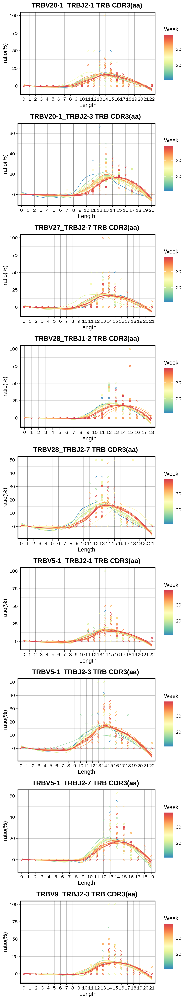

In [63]:
%%R -w 1500 -h 8000 -r 300 
grid.arrange(grobs = TRVplot_list, ncol = 1)  

In [64]:
%%R -w 2500 -h 2000 -r 300 
dir('/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/IR_VDJmerge/')
library(tidyverse)
library(reshape2)
library(gridExtra)
TRVplot_pvalue <- list()
paths='/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/IR_VDJmerge/'
# Adatalist=c("PBMC_abT(entry)_ratio.csv", "PBMC_Cycling Treg_ratio.csv", "PBMC_GNG4 +CD8aa+T_ratio.csv", "PBMC_Naïve CD4 T_ratio.csv", 
# "PBMC_Naïve CD8 T_ratio.csv", "PBMC_NK T_ratio.csv", "PBMC_Tem_ratio.csv", "PBMC_Th17like_INNATE_T_ratio.csv", "PBMC_Treg_ratio.csv")

# Adatalist=c( "PBMC_Naïve CD4 T_ratio.csv", 
# "PBMC_Naïve CD8 T_ratio.csv", "PBMC_NK T_ratio.csv", 
#             "PBMC_Tem_ratio.csv", "PBMC_Th17like_INNATE_T_ratio.csv", "PBMC_Treg_ratio.csv")
plot_list=list()
for (i in dir(paths)){
  print(i)
  name=gsub('_ratio.csv','',i)
  TCRdata=read.csv(paste0(paths,i))
#   TCRdata<-TCRdata[rowSums(TCRdata)>0,]
#   print(head(plot_Cell_sum_ratio_celltype(TCRdata)))
  
  TRAtem <- plot_Cell_sum_ratio_celltype(TCRdata)
#   print(Dfcalculate_correlation(TRAtem , "lengths", "week", "proportion"))
  TRAtem2 <- Dfcalculate_correlation(TRAtem , "lengths", "week", "proportion")

  TRAtem3 <- create_pval_plot(TRAtem2,paste0(name,' TRB'))  
#   print(TRAtem3)
 TRVplot_pvalue[[i]] <- create_pval_plot(TRAtem2,paste0(name,' TRB CDR3(aa)'))  
}


[1] "TRBV20-1_TRBJ2-1_ratio.csv"
[1] "TRBV20-1_TRBJ2-3_ratio.csv"
[1] "TRBV27_TRBJ2-7_ratio.csv"
[1] "TRBV28_TRBJ1-2_ratio.csv"
[1] "TRBV28_TRBJ2-7_ratio.csv"
[1] "TRBV5-1_TRBJ2-1_ratio.csv"
[1] "TRBV5-1_TRBJ2-3_ratio.csv"
[1] "TRBV5-1_TRBJ2-7_ratio.csv"
[1] "TRBV9_TRBJ2-3_ratio.csv"


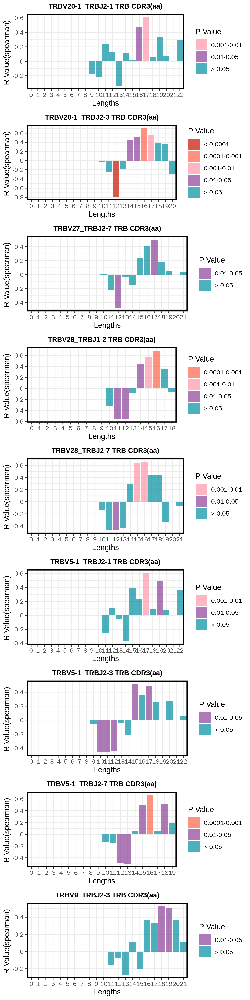

In [65]:
%%R -w 1500 -h 6000 -r 300 
grid.arrange(grobs = TRVplot_pvalue, ncol = 1)  

In [68]:
# %%R
# TRVplot_list[[1]]

In [103]:
# %%R -w 4400 -h 5000 -r 300 


# library(ggsci)
# library(tidyverse)
# library(ggplot2)
# library(ggpubr)


# TRB_ratio_alllong <- TRVplot_list[[1]] %>%
#   mutate(Date = ifelse(Week > 26, "late", "early"),
#          Organdate = paste(Organ, Date, sep = "_"))





# levels <- unique(TRB_ratio_alllong$Organdate)



# elements <- c("B_early", "B_late", "L_early", "S_early", "T_early")

# combinations <- combn(elements, 2)

# my_comparisons <- apply(combinations, 2, function(x) list(x[1], x[2]))

# # 打印结果
# # print(my_comparisons)


# # my_comparisons <- apply(combinations, 2, function(x) {list(x[1], x[2])})
# my_comparisons <- list(c("B_early", "B_late"))
# my_comparisons <- list(
#   c("B_early", "B_late"),
#   c("B_early", "L_early"),
#   c("B_early", "S_early"),
#   c("B_early", "T_early"),
#   c("B_late", "L_early"),
#   c("B_late", "S_early"),
#   c("B_late", "T_early"),
#   c("L_early", "S_early"),
#   c("L_early", "T_early"),
#   c("S_early", "T_early")
# )
# p <- ggplot(TRB_ratio_alllong, aes(x = Organdate, y = ratio, fill = Organdate)) +
#   geom_violin(position = position_dodge(width = 1), scale = 'width', color = "black") +
#   geom_boxplot(position = position_dodge(width = 1), outlier.size = 0.7, width = 0.1, show.legend = FALSE, color = "black") +
#   stat_compare_means(comparisons = my_comparisons, label = "p.signif", tip.length = 0) +
#   facet_wrap(~Length, scales = "free", labeller = label_both) +  
#   theme_minimal() +
#   theme(panel.grid = element_blank(), 
#         panel.background = element_blank(), 
#         panel.border = element_blank(),
#         axis.line = element_line(color = "black"),
#         axis.text.x = element_text(size = 12, angle = 45, hjust = 1), 
#         axis.text.y = element_text(size = 12),
#         plot.title = element_text(hjust = 0.5),
#         legend.title = element_blank(), 
#         legend.key = element_blank()) +
#   labs(x = '', y = '', title = 'TRB_ratio in Organ')+scale_fill_npg()


# print(p)